In [1]:
import numpy as np
import matplotlib.pyplot as plt
from functools import reduce
from scipy.stats import norm
from scipy.optimize import curve_fit

from astropy.io import fits
import astropy.units as u
from astropy.visualization import quantity_support
from astropy.cosmology import Planck18_arXiv_v2

from sklearn.neighbors import KernelDensity
from sklearn.cluster import KMeans
from sklearn import preprocessing
from sklearn import mixture

from astroML.linear_model import PolynomialRegression

rc = {"font.family" : "serif", 
      "mathtext.fontset" : "cm",
      "font.size" : "14",
      "figure.figsize" : [16,8]}
plt.rcParams.update(rc)

%config InlineBackend.figure_format='retina'

WARN: Could not locate executable g77
WARN: Could not locate executable f77
WARN: Could not locate executable ifort
WARN: Could not locate executable ifl
WARN: Could not locate executable f90
WARN: Could not locate executable DF
WARN: Could not locate executable efl
WARN: Could not locate executable gfortran
WARN: Could not locate executable f95
WARN: Could not locate executable g95
WARN: Could not locate executable efort
WARN: Could not locate executable efc
WARN: Could not locate executable flang
WARN: don't know how to compile Fortran code on platform 'nt'


WARNING (theano.configdefaults): g++ not available, if using conda: `conda install m2w64-toolchain`
WARNING (theano.configdefaults): g++ not detected ! Theano will be unable to execute optimized C-implementations (for both CPU and GPU) and will default to Python implementations. Performance will be severely degraded. To remove this warning, set Theano flags cxx to an empty string.
WARNING (theano.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


## Reading data from catalogues

In [2]:
# reading catalogues
mpajhu = '../Catalogues/sdss_mpajhu_catalogue.fits'
passive = '../Catalogues/sdss_portsmouth_passive_catalogue.fits'
starforming = '../Catalogues/sdss_portsmouth_starforming_catalogue.fits'
HI = '../Catalogues/AlfaAlfa_SDSS.fits'
mp_HI = '../catalogues/mp_HI.fits'
cross = '../catalogues/cross.fits' #matches of the 3 catalogues(mpajhu, HI, starforming)
manga = '../catalogues/SDSS17Pipe3D_v3_1_1.fits'
radius = '../catalogues/radius.fits'
agn_cat = '../catalogues/mpajhu_match.fits'

catalogues = [mpajhu, passive, starforming, HI, mp_HI, cross, manga, radius, agn_cat]

In [3]:
# dictionaries

data = {}
header = {}

for cat in catalogues:
    hdul = fits.open(cat)
    data[cat] = hdul[1].data
    header[cat] = hdul[1].header
    hdul.close()

## Initial plots

We have seen the histogram of SFR from the mpajhu cataloug and we notice that there are 2 values of the SFR that seem to be more probable. We expect that the peaks are given by the sum of different gaussian, so we can perform a gaussian mixture.

(796929, 1)


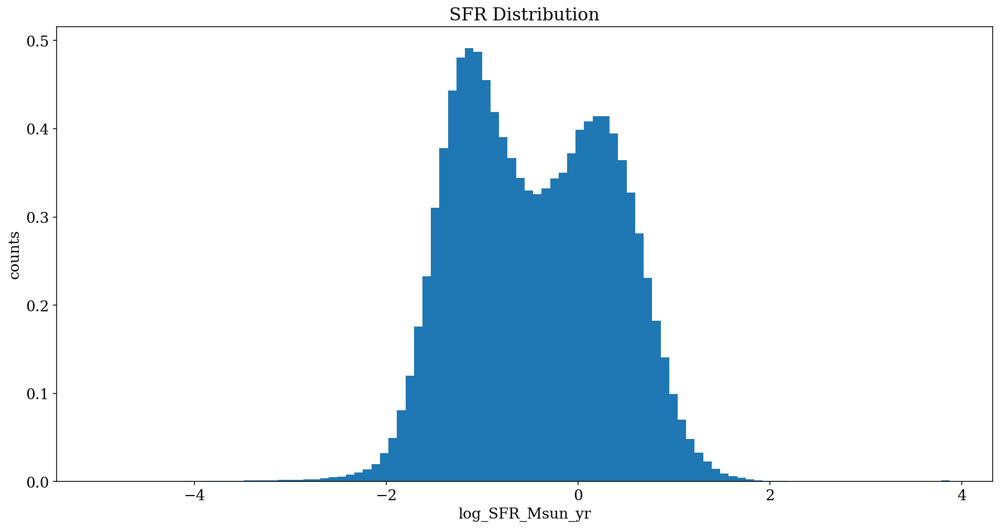

In [6]:
plt.hist(sfr_mp[:,0], bins=100, density=True)
plt.xlabel(key)
plt.ylabel('counts')
plt.title('SFR Distribution')

print(sfr_mp.shape)

plt.show()

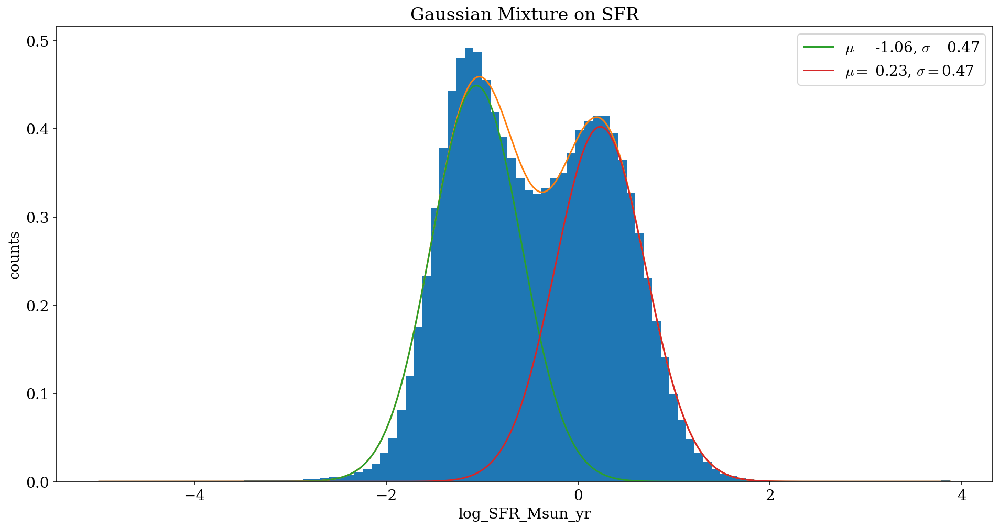

In [4]:
key = 'log_SFR_Msun_yr'
mask = (data[mpajhu].field(key)>-9.999e3) & (data[mpajhu].field('Log_stellar_mass_Msun')>-9.99e3) & (data[mpajhu].field('Parameter_flag')==1) 
sfr_mp = data[mpajhu].field(key)[mask]
sfr_mp = sfr_mp[:,np.newaxis] # transform in a shape for GM

gm = mixture.GaussianMixture(n_components=2, tol=1e-3, n_init=1)
gm_fitted = gm.fit(sfr_mp)
sfr_sorted = np.sort(sfr_mp, axis=0)

plt.hist(sfr_mp[:,0], bins=100, density=True)
plt.plot(sfr_sorted[:,0], np.exp(gm_fitted.score_samples(sfr_sorted)))

gaussians = [norm(mu, sigma) for mu,sigma in zip(gm_fitted.means_[:,0], np.sqrt(gm_fitted.covariances_[:,0]))]

x_grid = np.linspace(sfr_mp.min(), sfr_mp.max(), 1000)

[plt.plot(x_grid, weight * gaussian.pdf(x_grid), label = r'$\mu =$ %.2f, $\sigma = $%.2f' % (mu, sigma) )
 for weight, gaussian, mu, sigma in zip(gm_fitted.weights_, gaussians, gm_fitted.means_[:,0], np.sqrt(gm_fitted.covariances_[:,0]))]



plt.xlabel(key)
plt.ylabel('counts')
plt.title('Gaussian Mixture on SFR')
plt.legend()
plt.show()

In [7]:
print('the means are: ')
print(gm_fitted.means_)

print('\nthe errors are: ')
print(np.sqrt(gm_fitted.covariances_))

the means are: 
[[-1.06152492]
 [ 0.23065854]]

the errors are: 
[[[0.46692369]]

 [[0.47069688]]]


Now we can try to see if we can perform a clustering on the data, in order to see if these two different peaks are due to different physical procesess or something else through which we can discriminate between two different types of galaxies

## Clustering

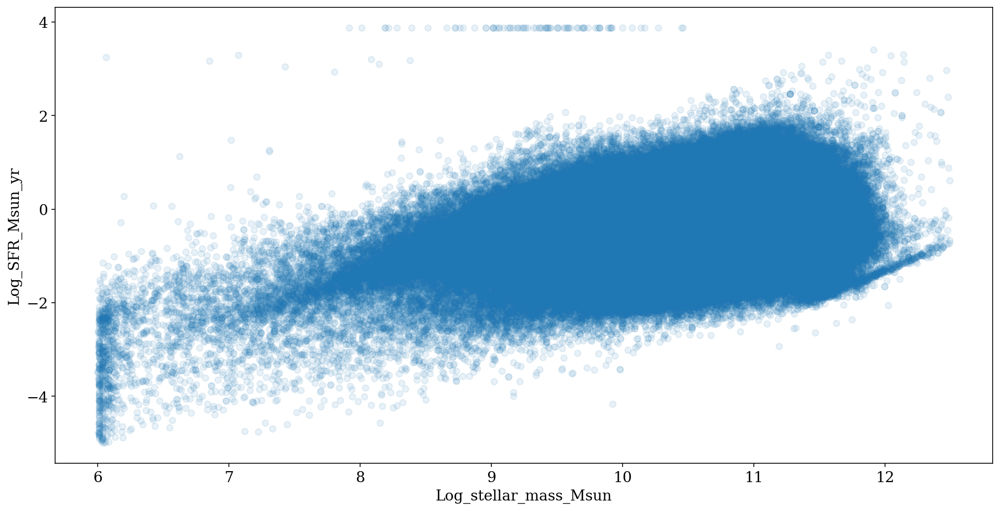

In [8]:
key_x = 'Log_stellar_mass_Msun'
key_y = 'Log_SFR_Msun_yr'

mask = (data[mpajhu].field(key_x)>-9.99e3) & (data[mpajhu].field(key_y)>-9.99e3) & (data[mpajhu].field('Log_stellar_mass_Msun') > -9.99e3) & (data[mpajhu].field('Parameter_flag')==1)

x = data[mpajhu].field(key_x)[mask]
y = data[mpajhu].field(key_y)[mask]

plt.xlabel(key_x)
plt.ylabel(key_y)

plt.scatter(x,y, alpha=.1)
plt.show()


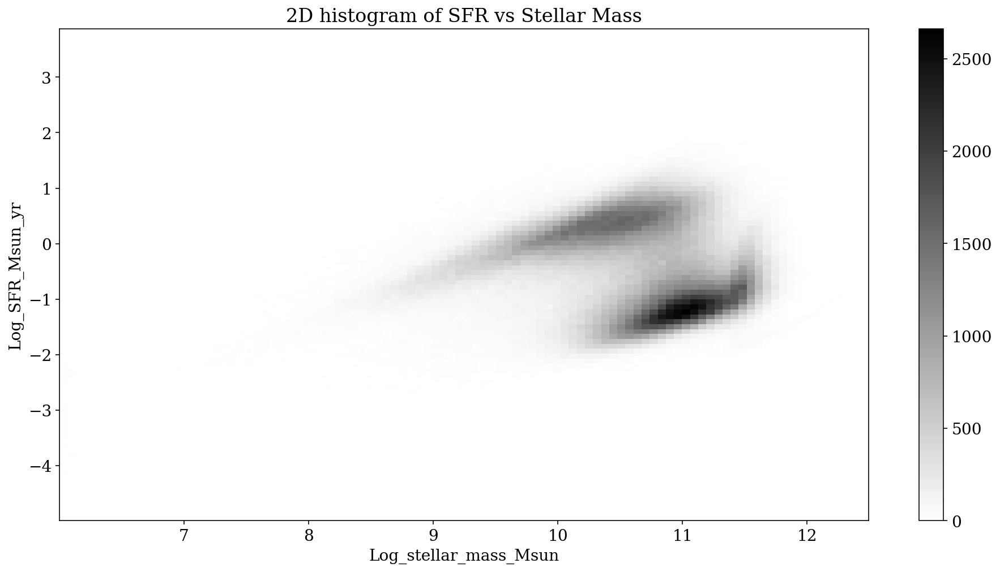

In [9]:
plt.hist2d(x,y, bins=100, cmap='binary')
plt.colorbar()
plt.xlabel(key_x)
plt.ylabel(key_y)
plt.title('2D histogram of SFR vs Stellar Mass')
plt.show()

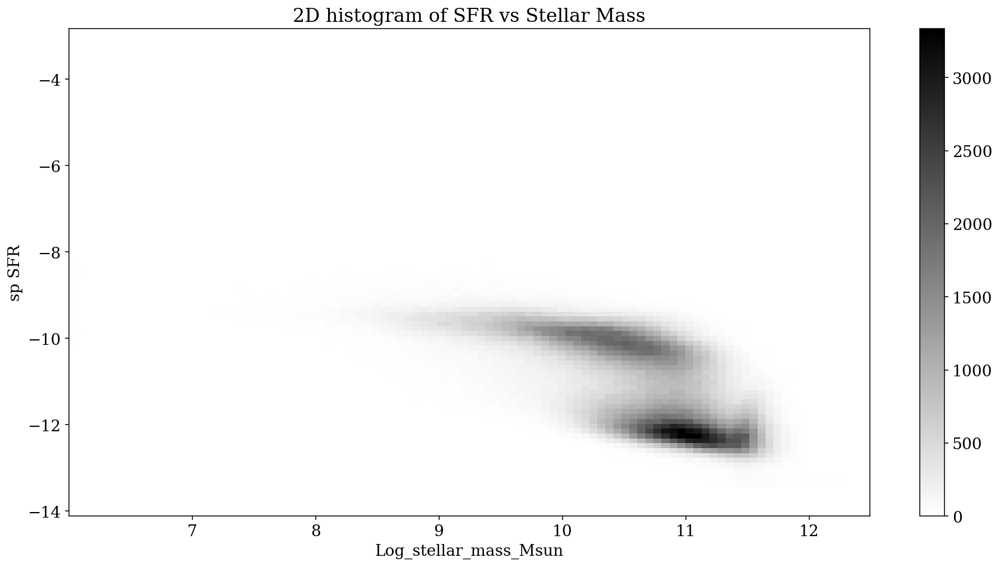

In [10]:
# define the specific SFR
sp_SFR_mp = y - x
plt.hist2d(x,sp_SFR_mp, bins=100, cmap='binary')
plt.colorbar()
plt.xlabel(key_x)
plt.ylabel('sp SFR')
plt.title('2D histogram of SFR vs Stellar Mass')
plt.show()

In [11]:
# now perform a clustering on the specific SFR vs the stellar mass
n_clusters = 2
clf = KMeans(n_clusters=n_clusters)

X = np.array([x,sp_SFR_mp]).T
clf.fit(X)
centers = clf.cluster_centers_ 
labels = clf.predict(X)

In [12]:
edge1 = np.mean([max(sp_SFR_mp[labels==0]), min(sp_SFR_mp[labels==1])])
print(edge1)

-11.162881731987


Is there causality between the SFR and the stellar mass?

with the mp_HI catalogue:

In [13]:
# load data
mask = (data[mp_HI].field('Log_SFR_Msun_yr')>-9.99e3) & (data[mp_HI].field('Log_stellar_mass_Msun')>-9.99e3) & (data[mp_HI].field('logMHI')>-9.99e3) &(data[mp_HI].field('Parameter_flag')==1)
log_sfr_mpHI = data[mp_HI].field('Log_SFR_Msun_yr')[mask]
log_stellar_mpHI = data[mp_HI].field('Log_stellar_mass_Msun')[mask]
log_MHI = data[mp_HI].field('logMHI')[mask]


Text(0, 0.5, 'Log_stellar_mass_Msun')

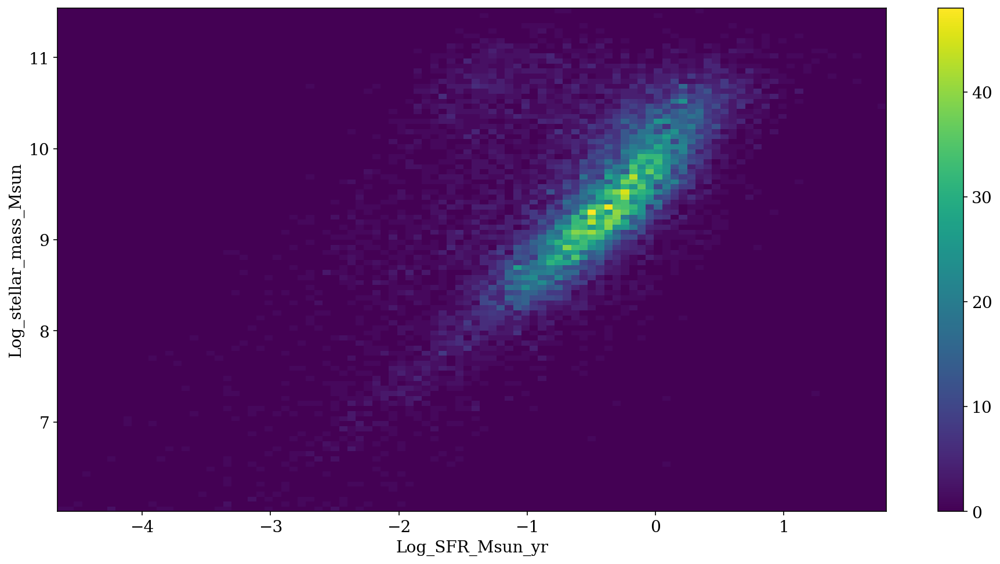

In [14]:
plt.hist2d(log_sfr_mpHI, log_stellar_mpHI,bins=100, cmap='viridis')
plt.colorbar()
plt.xlabel('Log_SFR_Msun_yr')
plt.ylabel('Log_stellar_mass_Msun')

In [15]:
def stellar_mass_th(SFR, Mgas, t):
    return Mgas*(np.exp(SFR/Mgas*t)-1)

Take the cross catalogue to get the age of the galaxies

In [16]:
mask = (data[cross].field('logMHI')>-9.99e3) & (data[cross].field('log_SFR_Msun_yr') > -9.99e3) & (data[cross].field('Log_stellar_mass_Msun_1')>-9.99e3) &(data[cross].field('Parameter_flag')==1) & (data[cross].field('Metallicity_nebular')>-9.99e3) 

log_mass_HI_cross = data[cross].field('logMHI')[mask]
log_sfr_cross = data[cross].field('log_SFR_Msun_yr')[mask]
log_Stellar_Mass_cross = data[cross].field('Log_stellar_mass_Msun_1')[mask]
age_cross = data[cross].field('Age_Gyr')[mask]*1e9 #age in Gyr
gct_cross = 10**(log_mass_HI_cross - log_sfr_cross) #gct timescale in yr
metallicity_cross = data[cross].field('Metallicity_nebular')[mask]


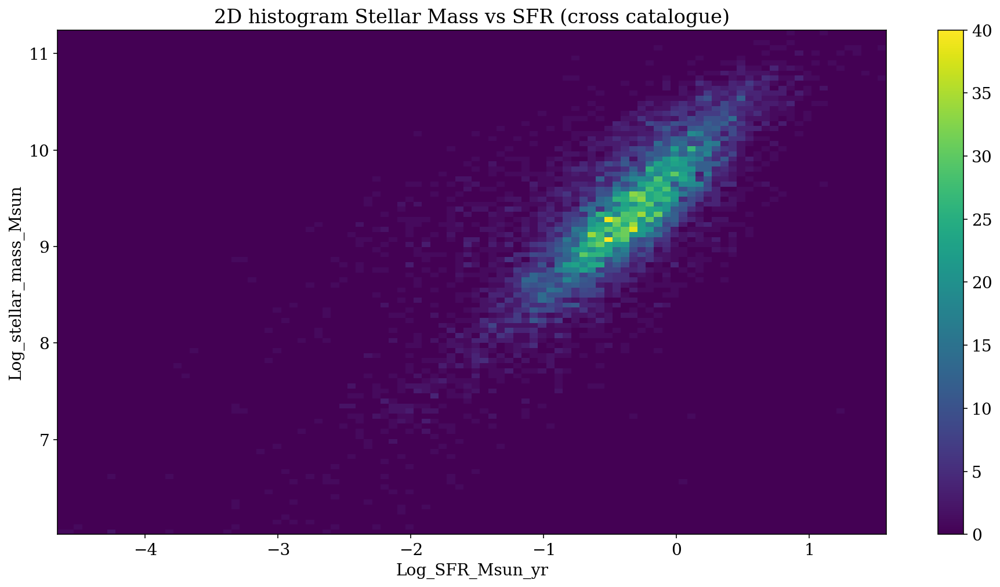

In [17]:
plt.hist2d(log_sfr_cross, log_Stellar_Mass_cross,bins=100, cmap='viridis')
plt.colorbar()
plt.xlabel('Log_SFR_Msun_yr')
plt.ylabel('Log_stellar_mass_Msun')
plt.title('2D histogram Stellar Mass vs SFR (cross catalogue)')
plt.show()

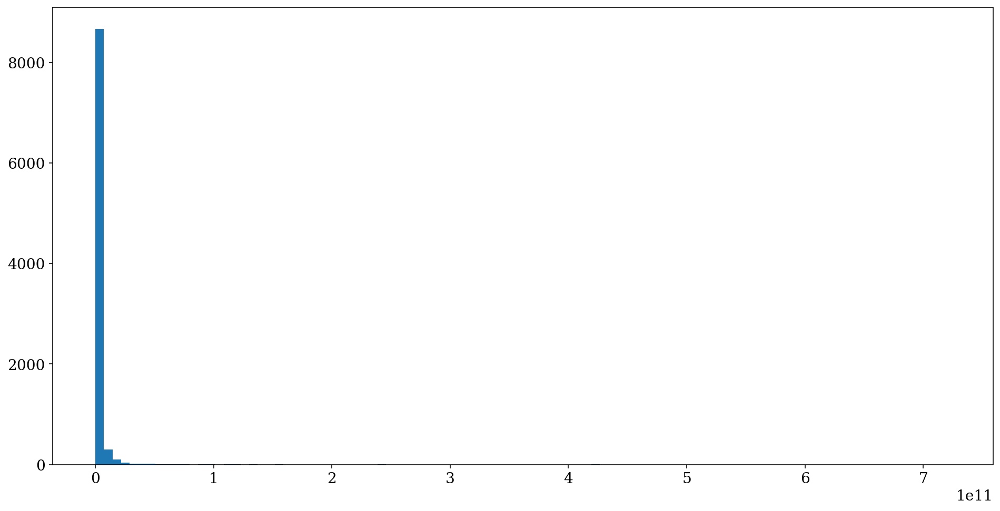

In [18]:
stellar_mass_array = stellar_mass_th(10**log_sfr_cross, 10**log_mass_HI_cross, age_cross)
plt.hist(stellar_mass_array[np.log10(stellar_mass_array)<12], bins=100)
plt.show()

Check if the distribution of stellar mass predicted follows the measured one:

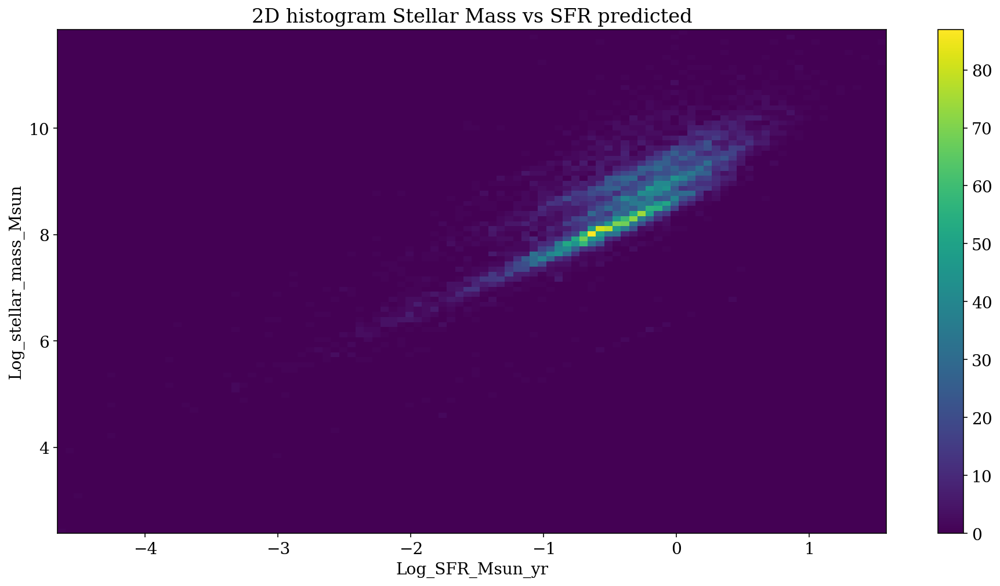

In [19]:
mask_stellar_mass = np.log10(stellar_mass_array)<12
plt.hist2d(log_sfr_cross[mask_stellar_mass], np.log10(stellar_mass_array[mask_stellar_mass]),bins=100, cmap='viridis')
plt.colorbar()
plt.xlabel('Log_SFR_Msun_yr')
plt.ylabel('Log_stellar_mass_Msun')
plt.title('2D histogram Stellar Mass vs SFR predicted')
plt.show()

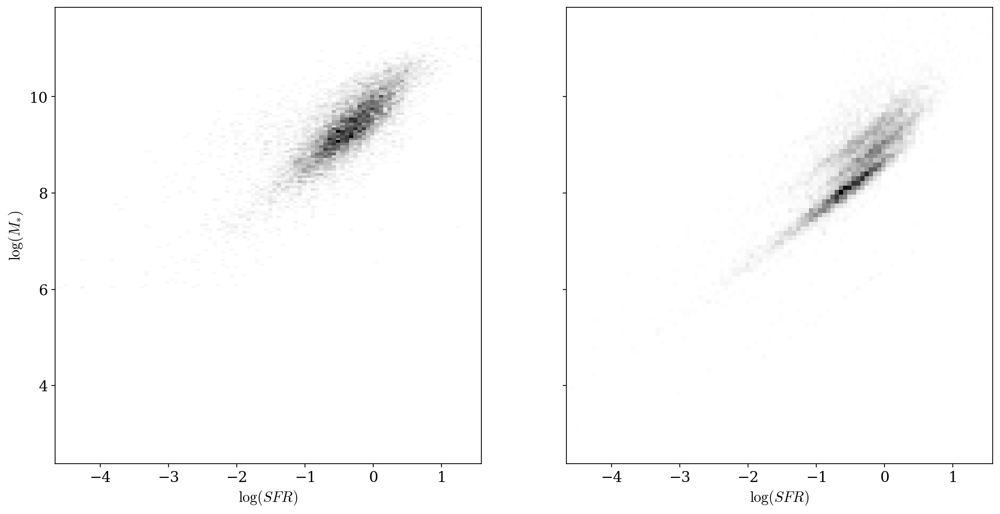

In [20]:
f, (ax1, ax2) = plt.subplots(1, 2, sharey=True)
ax1.hist2d(log_sfr_cross, log_Stellar_Mass_cross, bins = 100, cmap = 'binary', density = True)
ax1.set_xlabel(r'$\log(SFR)$')
ax1.set_ylabel(r'$\log(M_{*})$')
#------
ax2.hist2d(log_sfr_cross[mask_stellar_mass], np.log10(stellar_mass_array[mask_stellar_mass]), bins = 100, cmap = 'binary', density = True)
ax2.set_xlabel(r'$\log(SFR)$')
plt.show()

Now we want to study the relation between the metallicity and the stellar mass

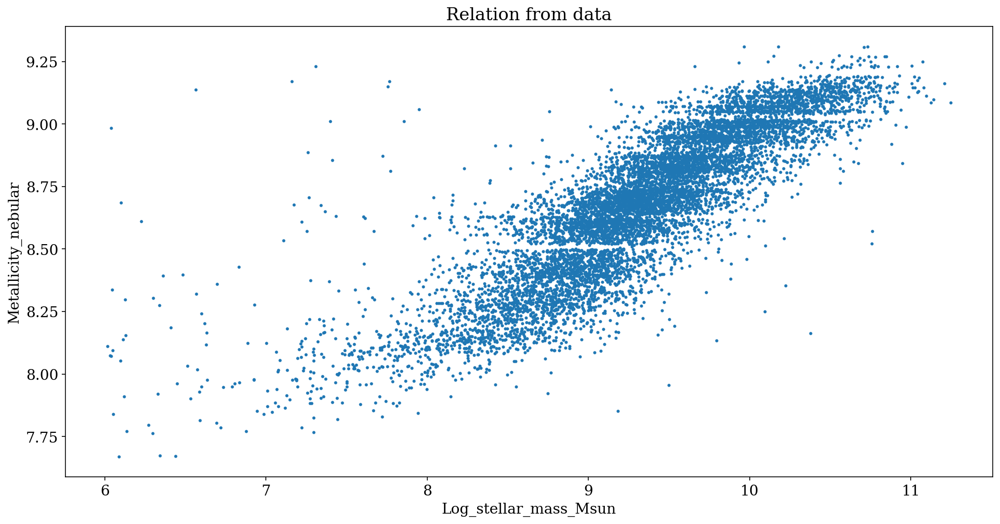

In [21]:
plt.scatter(log_Stellar_Mass_cross, metallicity_cross, s=4)
plt.xlabel('Log_stellar_mass_Msun')
plt.ylabel('Metallicity_nebular')
plt.title('Relation from data')
plt.show()

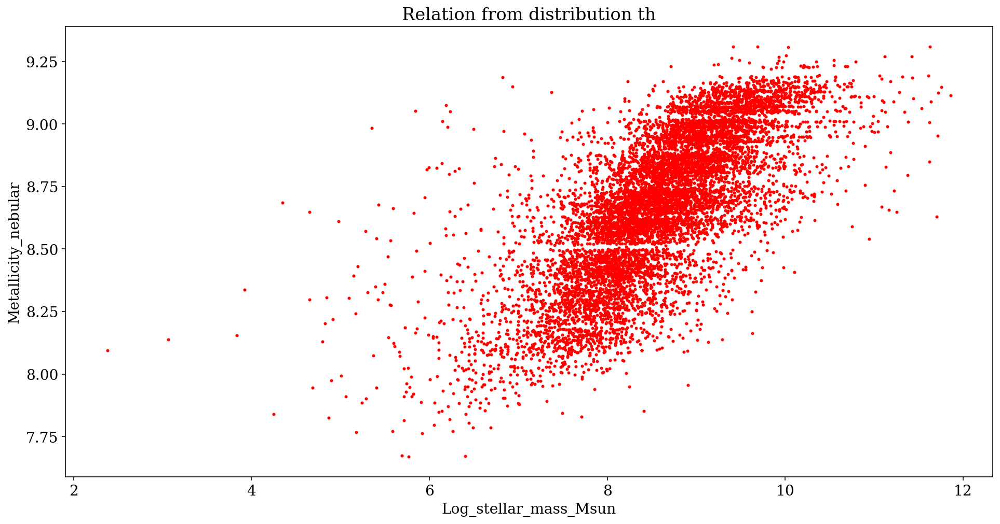

In [22]:
plt.scatter(np.log10(stellar_mass_array[mask_stellar_mass]), metallicity_cross[mask_stellar_mass], c="r", s=4)
plt.xlabel('Log_stellar_mass_Msun')
plt.ylabel('Metallicity_nebular')
plt.title('Relation from distribution th')
plt.show()

Searching from a relation between the metallicity of the galaxy gas and the time evolution

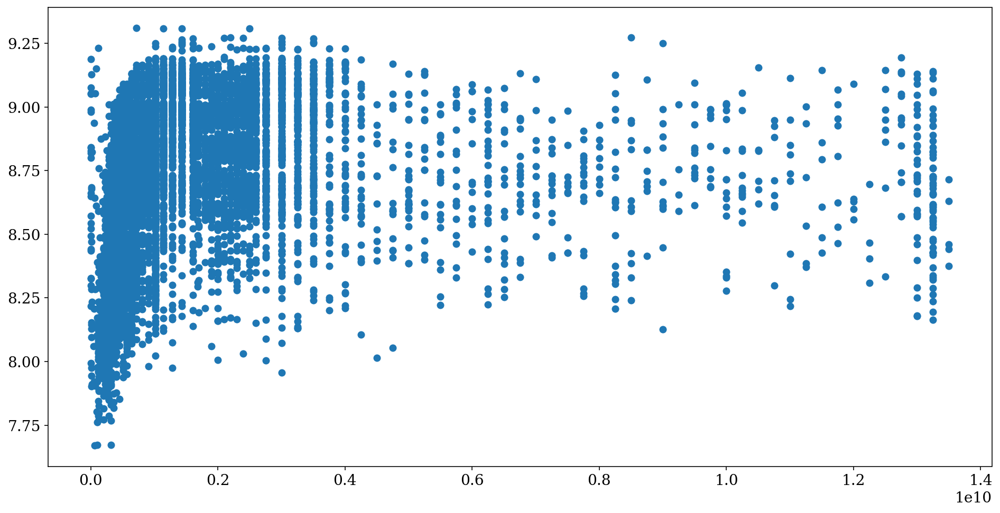

In [23]:
plt.scatter(age_cross, metallicity_cross)
#plt.xscale('log')
plt.show()

In [24]:
n_clusters = 2
clf = KMeans(n_clusters=n_clusters)

X = np.array([x,y]).T
clf.fit(X)
centers = clf.cluster_centers_ 
labels = clf.predict(X)

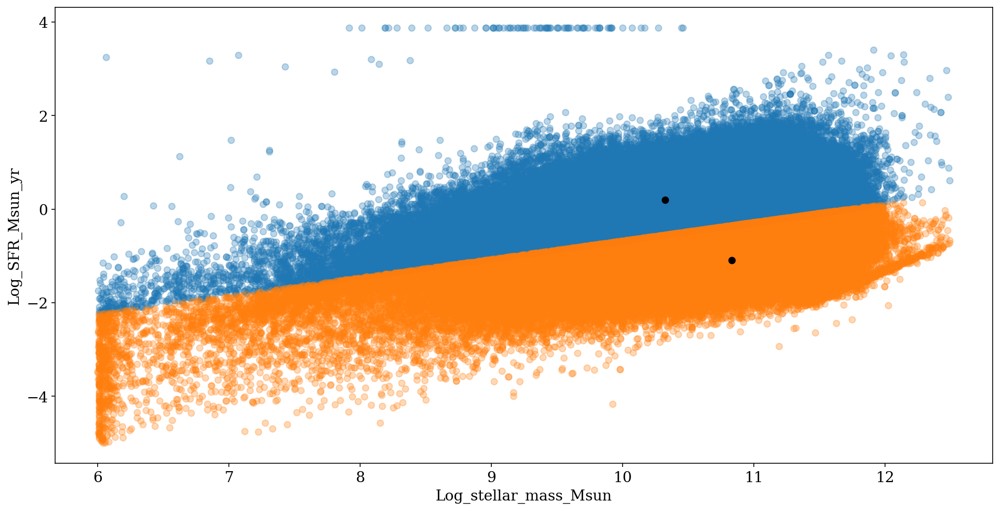

In [25]:
plt.figure()
for i in range(n_clusters):
    plt.scatter(X[labels == i, 0], X[labels == i, 1], alpha = 0.3)
plt.scatter(centers[:, 0], centers[:, 1], c='k')

plt.xlabel(key_x)
plt.ylabel(key_y)

#plt.loglog()
plt.show()

In [26]:
print(centers)

[[10.32366439  0.19702324]
 [10.83141385 -1.0971356 ]]


We may try to perform a clustering taking in account only the SFR

In [27]:
key_SFR = 'Log_SFR_Msun_yr'
mask = (data[mpajhu].field(key_SFR)>-9.99e3) & (data[mpajhu].field('Log_stellar_mass_Msun')>9)
SFR_mp = data[mpajhu].field(key_SFR)[mask]

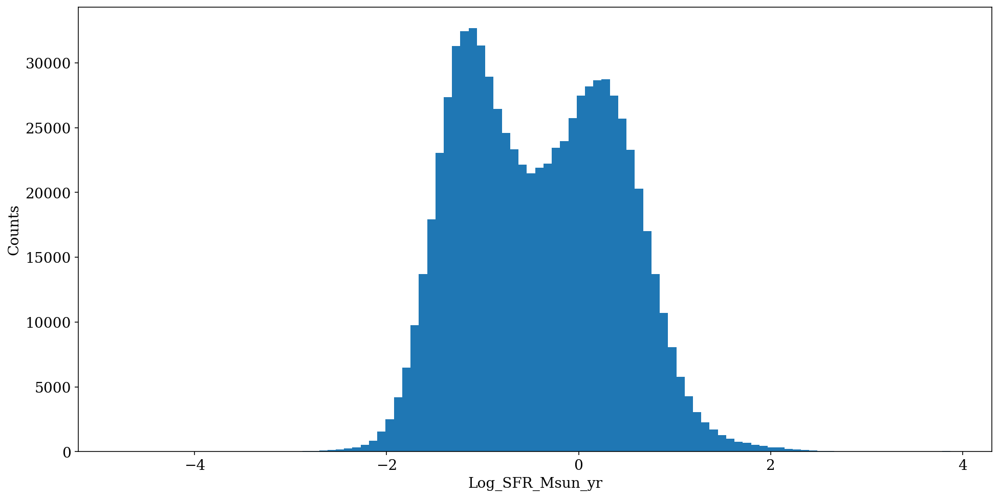

In [28]:
plt.hist(SFR_mp, bins=100)
plt.xlabel(key_SFR)
plt.ylabel('Counts')
plt.show()

We can try to fit a KDE

In [29]:
SFR_mp_new = SFR_mp[:,np.newaxis]
print(SFR_mp_new.shape)
kde = KernelDensity(kernel='gaussian',bandwidth=0.1).fit(SFR_mp_new)

(783839, 1)


In [30]:
xgrid = np.logspace(-5,5,1000)
ygrid = np.exp(kde.score_samples(np.log10(xgrid)[:,np.newaxis]))

[]

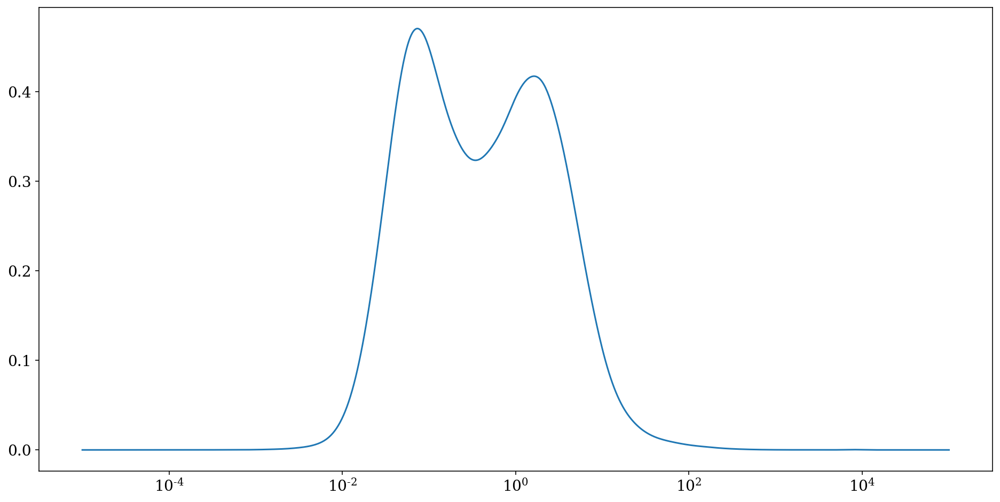

In [31]:
plt.plot(xgrid, ygrid)
plt.semilogx()

It seems to be 2 major peaks and another one on the left, but maybe we can neglet it?

Try to separate the two mode with clustering

In [32]:
SFR_mp_new = SFR_mp[:,np.newaxis]
clf = KMeans(n_clusters=2)
clf.fit(SFR_mp_new)

KMeans(n_clusters=2)

In [33]:
centers_SFR = clf.cluster_centers_
print('The centers for the SFR are:\n', centers_SFR)

The centers for the SFR are:
 [[-1.0793968 ]
 [ 0.30116474]]


These are the same results we have obtained with gaussian mixture

In [34]:
labels_SFR = clf.predict(SFR_mp_new)

We can try to get the boundary of every cluster

In [35]:
edge1 = np.mean([max(SFR_mp_new[labels_SFR==0]), min(SFR_mp_new[labels_SFR==1])])

print(edge1)

-0.3891169875860214


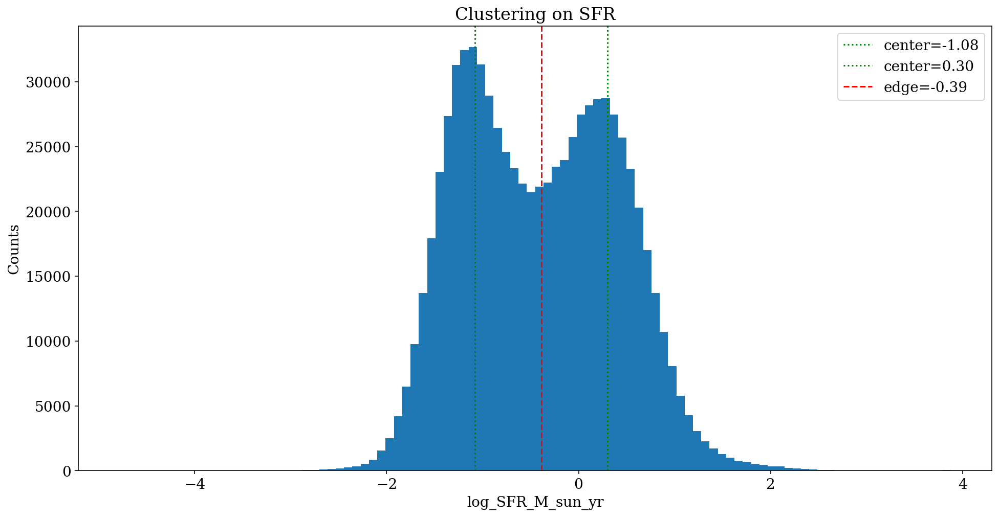

In [36]:
plt.hist(SFR_mp_new, bins=100)
for v in centers_SFR:
    plt.axvline(v, c='green', ls='dotted', label='center=%.2f' %v)
    
plt.axvline(edge1, c='red', ls='dashed', label='edge=%.2f' %edge1)
plt.title("Clustering on SFR")
plt.xlabel('log_SFR_M_sun_yr')
plt.ylabel('Counts')
plt.legend()
plt.show()

As for the gaussian mixture, we need three cluster to describe in a sufficient good manner the distribution of SFR.

## Gas consumption timescale (GCT) 

We can make the hypothesis that the value of the star formation rate depends at the first order on the amount of gas in the galaxy. At the second order enter also the density of gas in the galaxy. So the two properties needed to have an high SFR (gas can collapse) are the following: galaxy must have a big amount of gas and this amount of gas must have an high density in order to collapse. Galaxies with a low SFR are galaxy in which there is no enough gas that can collapse forming stars, or there is a sufficiently amount of gas, but it hasn't a density that allows it to collapse.

In this section of our investigation we are going to test this hypothesis.

In [37]:
# reading data from cross catalogue

mask = (data[cross].field('logMHI')>-9.99e3) & (data[cross].field('log_SFR_Msun_yr') > -9.99e3) & (data[cross].field('Log_stellar_mass_Msun_1')>-9.99e3)

log_mass_HI_cross = data[cross].field('logMHI')[mask]
log_sfr_cross = data[cross].field('log_SFR_Msun_yr')[mask]
log_Stellar_Mass_cross = data[cross].field('Log_stellar_mass_Msun_1')[mask]
age_cross = data[cross].field('Age_Gyr')[mask]*1e9 #age in Gyr
gct_cross = 10**(log_mass_HI_cross - log_sfr_cross) #gct timescale in yr

In [38]:
# reading data from mp_HI catalogue

mask = (data[mp_HI].field('logMHI')>-9.99e3) & (data[mp_HI].field('log_SFR_Msun_yr') > -9.99e3)

log_mass_HI_2 = data[mp_HI].field('logMHI')[mask]
log_sfr_2 = data[mp_HI].field('log_SFR_Msun_yr')[mask]

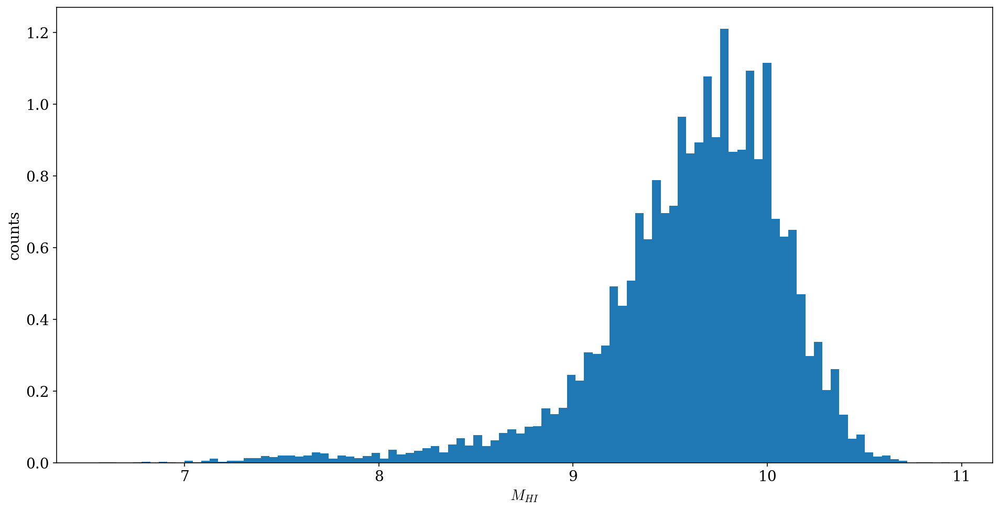

In [39]:
plt.hist(log_mass_HI_cross, bins=100, density=True)
plt.xlabel(r'$M_{HI}$')
plt.ylabel('counts')
plt.show()

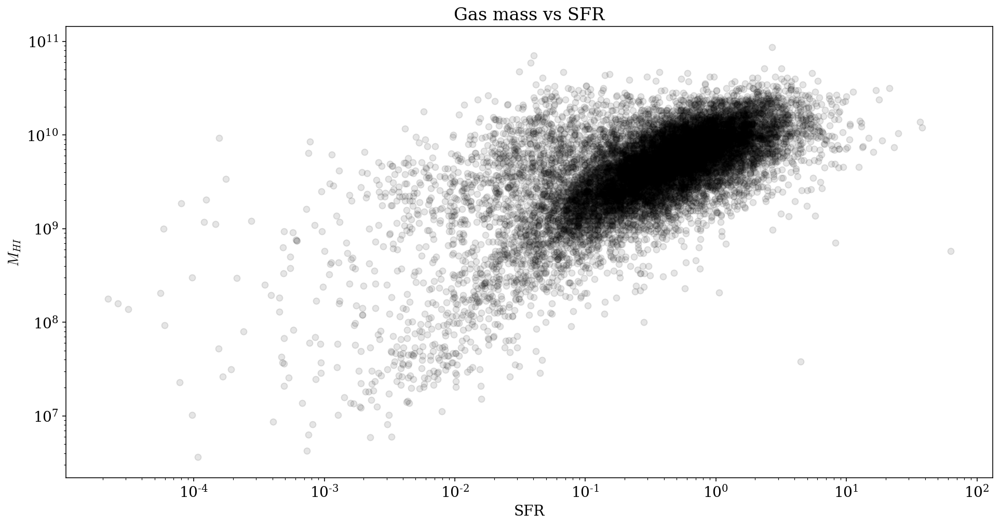

In [40]:
plt.scatter(10**log_sfr_cross, 10**log_mass_HI_cross, c='k', alpha=0.1)
colors = ['r','g']
#for v,c in zip(centers_SFR,colors):
    #plt.vlines(10**v, min(10**log_mass_HI_cross), max(10**log_mass_HI_cross), color=c, label='centers=%.2f'%v)
    
plt.xlabel('SFR')
plt.ylabel(r'$M_{HI}$')
plt.loglog()
plt.title('Gas mass vs SFR')
#plt.legend()
plt.show()

We can see that, how we expected, the SFR increase as the mass of HI in the galaxy increase.

From this scattering plot we can see that in the cross catalogue between mp and HI the amount of galaxies with a SFR of $10^{-4}$ is negligible. So it can be due a bias of the mp catalogue we have studied before

Plot the Mgas vs log Stellar Mass

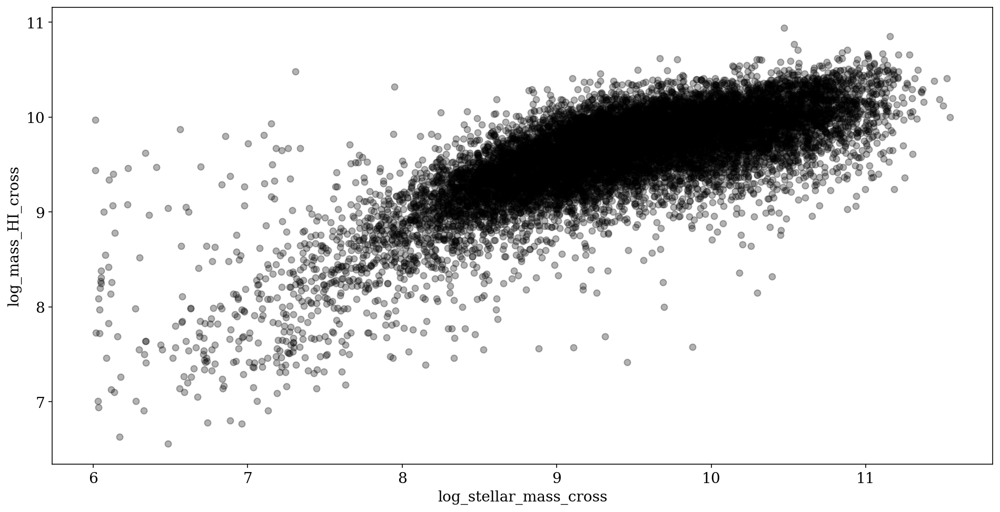

In [41]:
plt.scatter(log_Stellar_Mass_cross, log_mass_HI_cross, c='k', alpha=0.3)
plt.xlabel('log_stellar_mass_cross')
plt.ylabel('log_mass_HI_cross')
plt.show()

Here we study the behaviour of the SFR as a function of time, taking in account the age of the galaxy and the gas consumption timescale.

Text(0.5, 1.0, 'timescales')

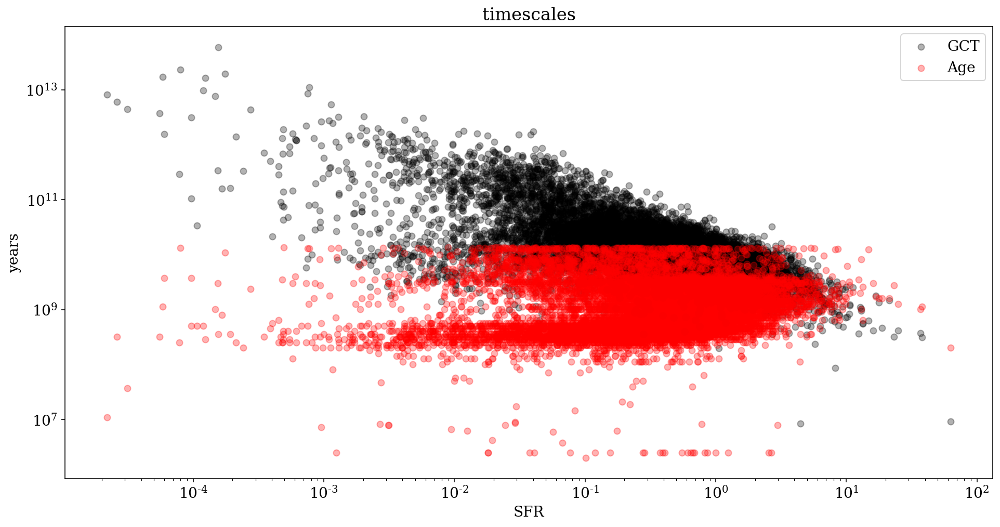

In [42]:
plt.scatter(10**log_sfr_cross, gct_cross, c='k', alpha = 0.3, label = 'GCT')
plt.scatter(10**log_sfr_cross, age_cross, c='r', alpha = 0.3, label = 'Age')
plt.xlabel('SFR')
plt.ylabel('years')
plt.loglog()
plt.legend()
plt.title('timescales')

## HI density

In this part of the work we want to test the hypothesis that high SFR correspond to high density of gas in the galaxy. To get the density of gas in a galaxy we need the effective radius that gives us a size for the galaxy, and we assume a circular surface density.

In [43]:
mask = (data[radius].field('logMHI')>-9.99e3) & (data[radius].field('log_SFR_Msun_yr')>-9.99e3) & (data[radius].field('Re_kpc')>-9.99e3) & (data[radius].field('Age_Gyr')>-9.99e3)

log_mass_HI_r = data[radius].field('logMHI')[mask]
log_SFR_r = data[radius].field('log_SFR_Msun_yr')[mask]
Re_r = data[radius].field('Re_kpc')[mask] #effective radius
Age_r = data[radius].field('Age_Gyr')[mask]

rho_HI_r = 10**log_mass_HI_r/Re_r**2 #circular surface density


There is a relation called the Kennicutt-Schimdt relation that relates the surface gas density of a galaxy with the SFR density. The Kennicutt-Schimdt relation is given by the following: 

$\Sigma_{SFR}\propto\bigl(\Sigma_{gas}\bigr)^{n}$

Kennicutt examinated the relation between the gas density and the SFR for more than $100$ galaxies, and he found that $n=1.4\pm0.15$

Some recently observations show that this value found by Kennicutt is not valid for galaxies formed in the first two billion years after the Big Bang, because in the first phases of evolution, galaxies were way less efficient in converting gas in stars, due to the small presence of dust.

In [44]:
def kennicutt(x, A, n):
    return A * x**(n) #Kennicutt-Schimdt relation

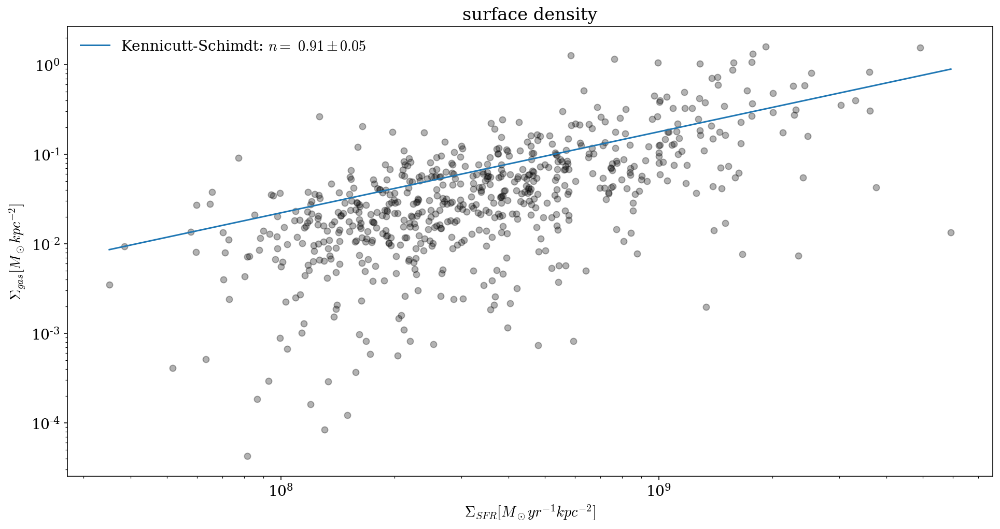

In [45]:
# Let's plot our data with this relation:

p0 = [1,1]
rho_SFR_r = 10**log_SFR_r/Re_r**2
best_p0, cov_0 = curve_fit(kennicutt, rho_HI_r, rho_SFR_r, p0=p0)

grid = np.linspace(rho_HI_r.min(), rho_HI_r.max(), 1000)

plt.scatter(rho_HI_r, rho_SFR_r, c='k', alpha=0.3)
plt.plot(grid, kennicutt(grid, *np.abs(best_p0)), label='Kennicutt-Schimdt: $n = $ $%.2f \pm %.2f $' % (best_p0[1], np.sqrt(cov_0[1,1])))

plt.xlabel(r'$\Sigma_{SFR}[M_\odot yr^{-1} kpc^{-2}]$')
plt.ylabel(r'$\Sigma_{gas}[M_\odot kpc^{-2}]$')
plt.loglog()
plt.legend(frameon = False)
plt.title('surface density')
plt.show()

In this catalogue we have a little amount of data to take in account ($600$ more or less), and the fit performed don't converge with the expected value (also if is not so far).

Maybe these this deviation from the value found by Kennicutt is due to the age of the galaxy we are taking in account in the 'radius' catalogue. Let's check it:


Number of galaxy in the catalogue:  632


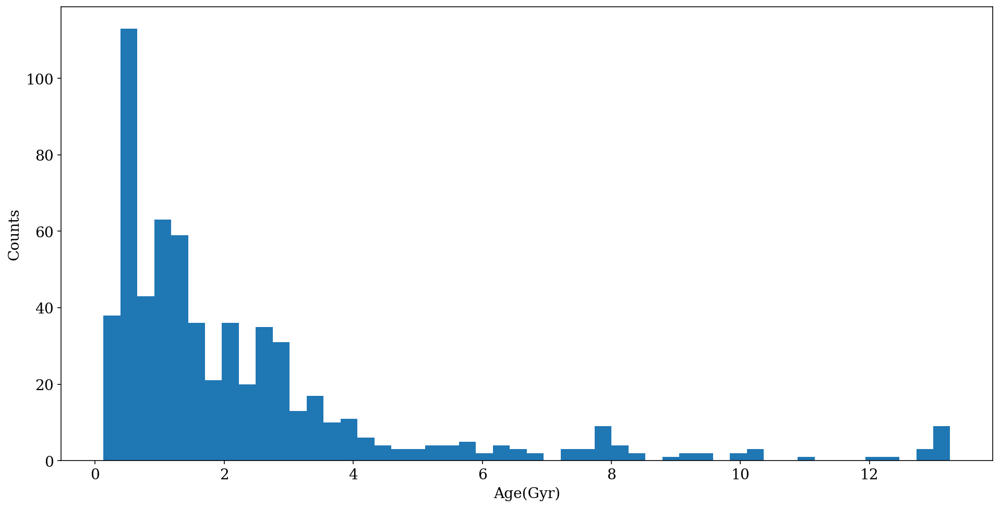

In [46]:
print('Number of galaxy in the catalogue: ', len(Age_r))
plt.hist(Age_r, bins=50)
plt.xlabel('Age(Gyr)')
plt.ylabel('Counts')
plt.show()

The majority of the galaxies in the catalogue haven't an age such that the result on kennicutt relation is biase. So probably this relation is only due to the small number of galaxies in the catalogue.

In order to get a better analysis of the relation, we downloaded another catalogue and we check our hypothesis on this new one. So first we need to perform some data analysis on this new catalogue.

## Manga Catalogue

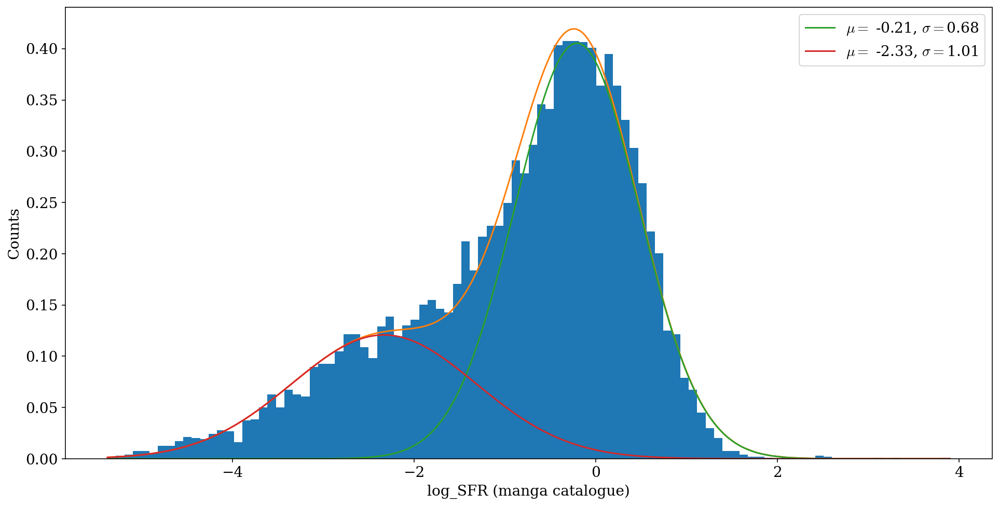

In [47]:
logSFR_manga = data[manga].field('log_SFR_Ha')[data[manga].field('log_SFR_Ha')>-9.99e3]
logSFR_manga_n = logSFR_manga[:,np.newaxis]

gm = mixture.GaussianMixture(n_components=2, tol=1e-3, n_init=1)
gm_fitted = gm.fit(logSFR_manga_n)
sfr_sorted_manga = np.sort(logSFR_manga_n, axis=0)

plt.hist(logSFR_manga_n[:,0], bins=100, density=True)
plt.plot(sfr_sorted_manga[:,0], np.exp(gm_fitted.score_samples(sfr_sorted_manga)))

gaussians = [norm(mu,sigma) for mu, sigma in zip(gm_fitted.means_[:,0], np.sqrt(gm_fitted.covariances_[:,0]))]

x_grid = np.linspace(logSFR_manga_n.min(), logSFR_manga_n.max(), 1000)
[plt.plot(x_grid, w*gaussian.pdf(x_grid), label=r'$\mu =$ %.2f, $\sigma = $%.2f' % (mu, sigma)) for w, gaussian, mu, sigma in zip(gm_fitted.weights_, gaussians, gm_fitted.means_[:,0], np.sqrt(gm_fitted.covariances_[:,0]))]

plt.xlabel('log_SFR (manga catalogue)')
plt.ylabel('Counts')
plt.legend()
plt.show()

In [48]:
print('The means are:')
print(gm_fitted.means_)

print('\nThe covariances are:\n ')
print(np.sqrt(gm_fitted.covariances_))

The means are:
[[-0.20714151]
 [-2.33089147]]

The covariances are:
 
[[[0.68192388]]

 [[1.01482886]]]


Let's try a little clustering:

In [49]:
clf = KMeans(n_clusters=2)
clf.fit(logSFR_manga_n)

KMeans(n_clusters=2)

In [50]:
centers_SFR_manga = clf.cluster_centers_ #compute the centers
labels_manga = clf.predict(logSFR_manga_n) #predict the labels

print('Centers:\n', centers_SFR_manga)

Centers:
 [[-0.17159042]
 [-2.47431354]]


The values found here are compatible with the ones found with gaussian mixture.

In [51]:
# compute the threshold between the two clusters:
edge = np.mean([max(logSFR_manga_n[labels_manga==0]), min(logSFR_manga_n[labels_manga==1])])
print('Edge:', edge)

Edge: -0.7377981774227598


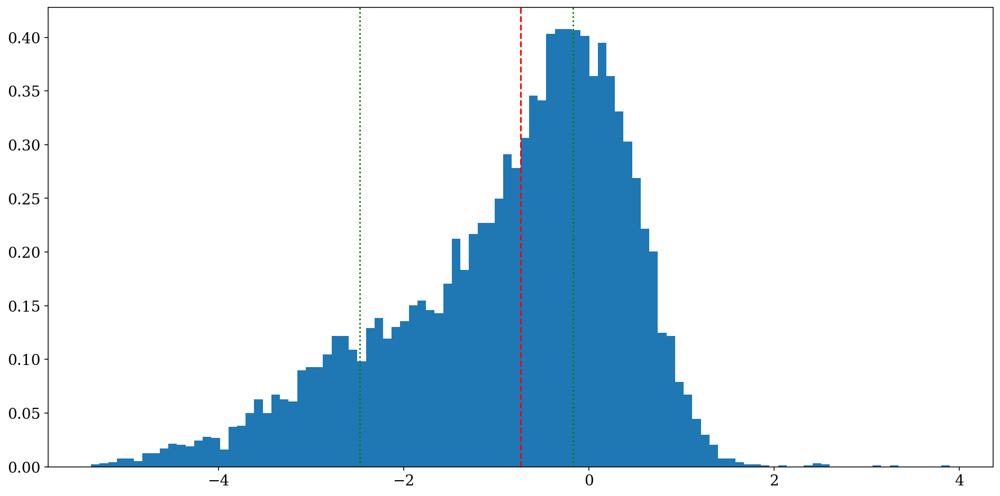

In [52]:
plt.hist(logSFR_manga_n[:,0], bins=100, density=True)
for v in centers_SFR_manga:
    plt.axvline(v, c='green', ls='dotted')
    
plt.axvline(edge, c='red', ls='dashed')
plt.show()

Now we want to check the hypothesis on the relation between the SFR and the amount and density of gas made before.

In [53]:
key = 'log_Mass_gas_Av_gas_OH'
mask = (data[manga].field(key)>-9.99e3) & (data[manga].field('Re_kpc')>-9.99e3)
gas_mass_manga = data[manga].field(key)[mask]
R_e_manga = data[manga].field('Re_kpc')[mask]
sfr_manga = data[manga].field('log_SFR_Ha')[mask]

surface_density_manga = gas_mass_manga / R_e_manga**2
sfr_density_manga = sfr_manga / R_e_manga**2

In [54]:
# Now fit with kennicutt relation
p0 = [1,1]
best_p, cov = curve_fit(kennicutt, surface_density_manga, sfr_density_manga, p0=p0)

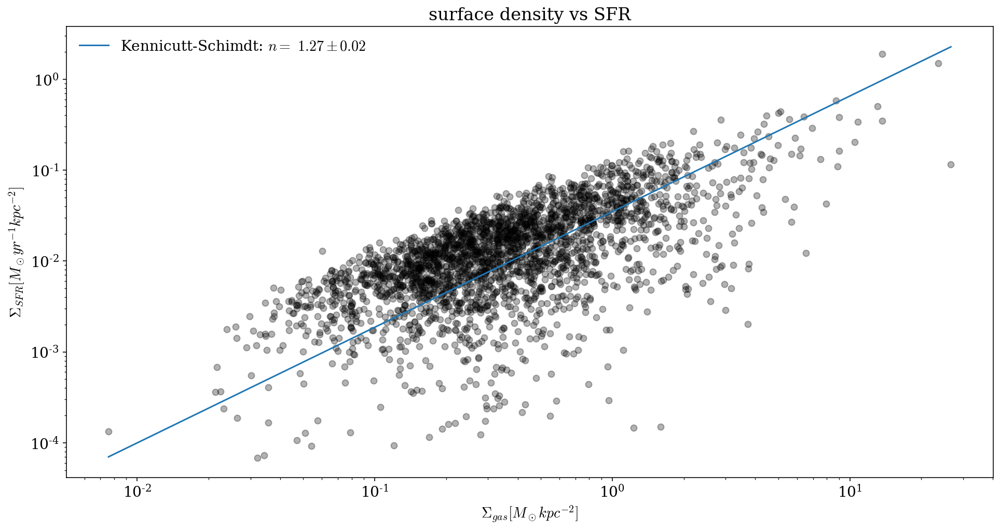

In [55]:
grid = np.linspace(surface_density_manga.min(), surface_density_manga.max(), 1000)

plt.scatter(surface_density_manga, sfr_density_manga, c='k', alpha=0.3)
plt.plot(grid, kennicutt(grid, *np.abs(best_p)), label='Kennicutt-Schimdt: $n = $ $%.2f \pm %.2f $' % (best_p[1], np.sqrt(cov[1,1])))
plt.ylabel(r'$\Sigma_{SFR}[M_\odot yr^{-1} kpc^{-2}]$')
plt.xlabel(r'$\Sigma_{gas}[M_\odot kpc^{-2}]$')
plt.loglog()
plt.title('surface density vs SFR')
plt.legend(frameon = False)
plt.show()

With this catalogue the value estrapolated from the fit is compatible with the one get by Kenicutt

We can get the metallicuty of galaxies from the emission lines through which we can get also the redsift, the metallicity of stars can get from the absorption lines

Study the relation between logSFR and log Stellar mass -> galaxies are not randomly distributed, but there are two main groups of galaxies in this plot. The first one with more gal. we can call Main Sequence, the other passive galaxies. 

1st question: Is SFR causally related with the stellar mass? There is a correlation between the two ut, it doesn't necessarly implies causality. At first order seems that $SFR\propto M_\odot$. 

Second question: why this distribution is bimodal? 

We can also investigate the relation between the stellar mass and the metallicity. There is a relation that seems to be linear in a loglog scale.

We want to joint all this thing togheter in order to address these questions. We have to build a physical model of a galaxy. 
Consider a galaxy with something around. The physical variables that describe a galaxy are: Gas Mass, M_stars, SFR and the other we have already seen.
Consider some gas that go in the galaxy and some gas that go out. Is there a relation between these two variables? M_Gas_in can depends on the redshift, number density of galaxies, correlation between the m_gas_in different near galaxie. M_gas_out can depends on SFR, AGN, redshift, environment.
We can also have metallicity in and metallicity out.

Which is the most important physical process or variable that control the inflow and outflow of gas and other properties?

Outside the galaxies must be something

## Gas resevoir equilibrium

In [56]:
eagle = np.loadtxt('../catalogues/eagle.txt', skiprows=1)

In [57]:
print(eagle.shape)
print(eagle[:,0])

(40312, 11)
[48.446 71.962 68.5   ... 78.536 86.964  2.849]


In [58]:
X_position_cMpc_eagle = eagle[:,0]
Y_position_cMpc_eagle = eagle[:,1]
Z_position_cMpc_eagle = eagle[:,2]
redshift_eagle = eagle[:,3]
Stellar_mass_Msun_eagle = eagle[:,4]
SFR_Msun_yr_eagle = eagle[:,5]
Metallicity_eagle = eagle[:,6]
Oxygen_abundance_eagle = eagle[:,7]
Halo_mass_Msun_eagle = eagle[:,8]
Mass_200crit_Msun_eagle = eagle[:,9]
Radius_200crit_pkpc_eagle = eagle[:,10]

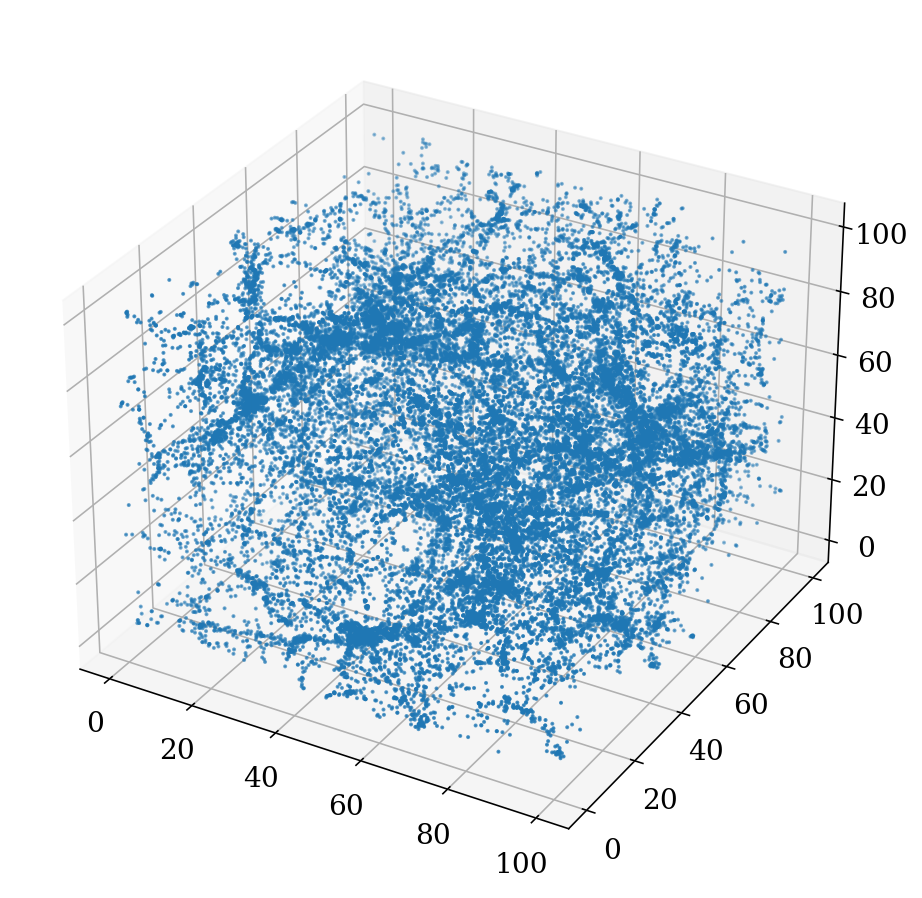

In [59]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

ax.scatter(X_position_cMpc_eagle, Y_position_cMpc_eagle, Z_position_cMpc_eagle, s=1)
plt.show()

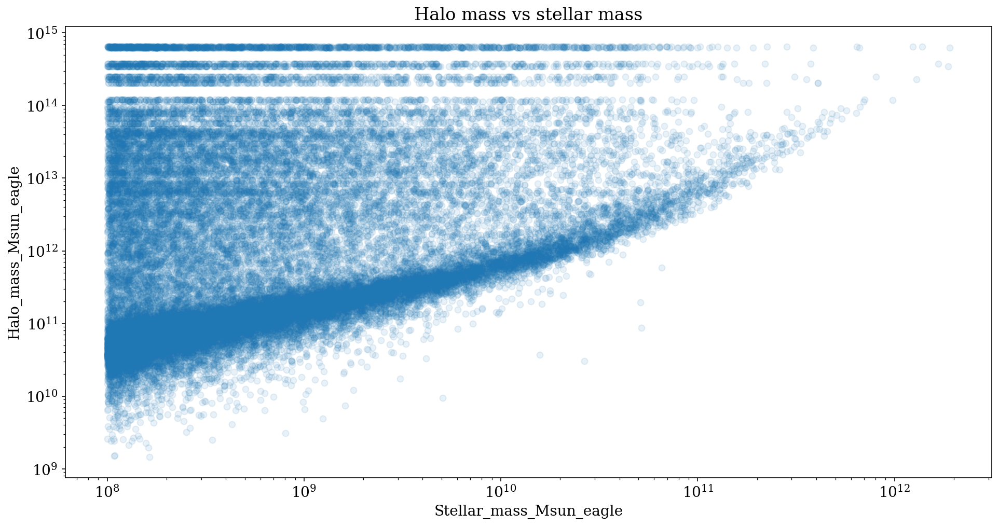

In [60]:
plt.scatter(Stellar_mass_Msun_eagle, Halo_mass_Msun_eagle, alpha=0.1)
plt.xlabel('Stellar_mass_Msun_eagle')
plt.ylabel('Halo_mass_Msun_eagle')
plt.title('Halo mass vs stellar mass')
plt.xscale('log')
plt.yscale('log')
plt.show()

We can take only the maximum mass of the galaxies at a fixed halo mass

In [61]:
M_halo_unique_temp = np.unique(Halo_mass_Msun_eagle)
M_halo_unique, M_star_unique = [], []
for m in M_halo_unique_temp:
    mask = Halo_mass_Msun_eagle == m
    M = max(Stellar_mass_Msun_eagle[mask])
    M_star_unique.append(M)
    M_halo_unique.append(m)


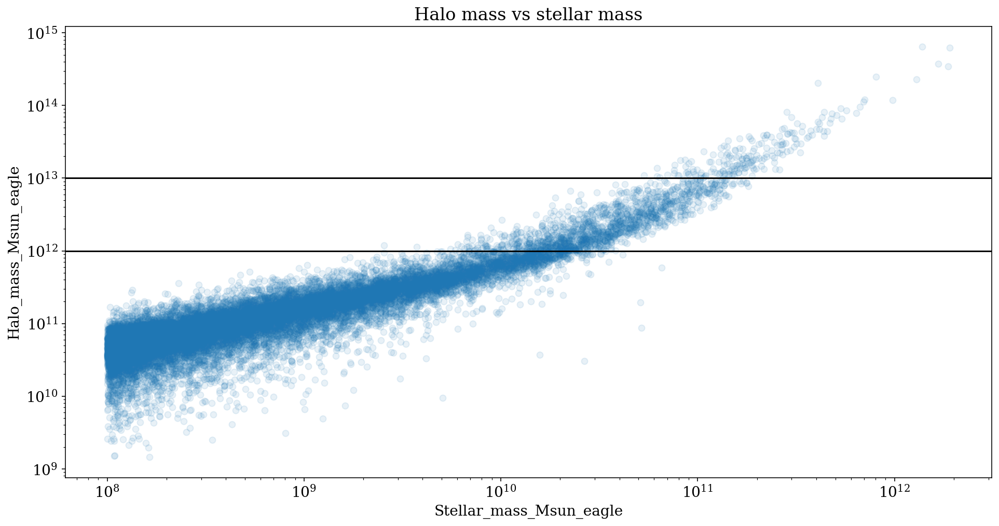

In [62]:
plt.scatter(M_star_unique, M_halo_unique, alpha=0.1)
plt.axhline(1e13, c='k')
plt.axhline(1e12, c='k')
plt.xlabel('Stellar_mass_Msun_eagle')
plt.ylabel('Halo_mass_Msun_eagle')
plt.title('Halo mass vs stellar mass')
plt.xscale('log')
plt.yscale('log')
plt.show()

In the previous plot we also draw the value of Halo mass that correspond to the maximum halo mass, because over these values $\tau_{cool}<\tau_{ff}$ and the gas stop to accreate on the galaxy

Now we want to fit this relation with a polinomial one.

d 2
parameters:  [14.36099933 -1.32971516  0.10799258]
d 3
parameters:  [-24.35942975  11.07291505  -1.20807939   0.04625818]
d 4
parameters:  [-7.59428654e+01  3.27993830e+01 -4.62257742e+00  2.83549445e-01
 -6.15249455e-03]
d 5
parameters:  [ 3.44149684e+02 -1.86132872e+02  4.08188920e+01 -4.41171398e+00
  2.35346365e-01 -4.94647408e-03]


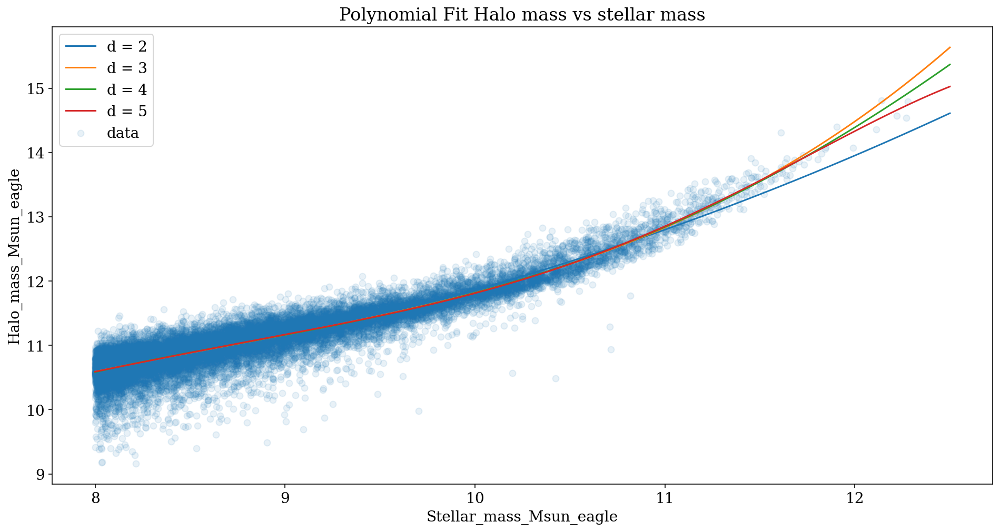

In [63]:
degrees = np.arange(2,6)
log_Mstar_eagle = np.log10(M_star_unique)
log_Mhalo_eagle = np.log10(M_halo_unique)
log_M_grid = np.linspace(8, 12.5, 1000)
for d in degrees:
    poly_model = PolynomialRegression(d)
    poly_model.fit(log_Mstar_eagle[:,np.newaxis], log_Mhalo_eagle)
    M_poly = poly_model.predict(log_M_grid[:,np.newaxis])
    
    print('d', d)
    print('parameters: ', poly_model.coef_)
    
    plt.plot(log_M_grid, M_poly, label='d = %i' %d)
    
plt.scatter(log_Mstar_eagle, log_Mhalo_eagle, alpha=0.1, label='data')
plt.xlabel('Stellar_mass_Msun_eagle')
plt.ylabel('Halo_mass_Msun_eagle')
plt.title('Polynomial Fit Halo mass vs stellar mass')
plt.legend()
plt.show()


Let's try to perform a cross validation in order to get which is the best polynomial degree

In [64]:
def error(y, x, model):
    return np.sqrt(np.sum((y - model.predict(x[:,np.newaxis]))**2)/len(x))


In [65]:
#K-fold cross validation:
K = 5
step = int(len(log_Mstar_eagle)/K)
indeces = np.arange(0, len(log_Mstar_eagle))
np.random.shuffle(indeces)
m_star_random = log_Mstar_eagle[indeces]
m_halo_random = log_Mhalo_eagle[indeces]


[5, 5, 5, 5, 5]
best order:  5


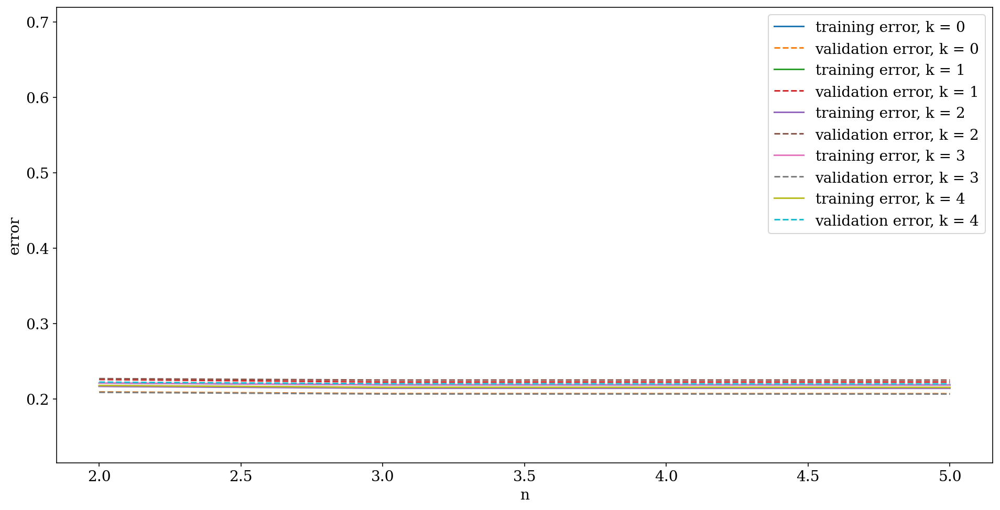

In [66]:
d_list = []
for k in range(K):
    m_star_val = m_star_random[k*step : (k+1)*step]
    m_star_train = np.delete(m_star_random, np.arange(k*step, (k+1)*step), axis=0)
    
    m_halo_val = m_halo_random[k*step : (k+1)*step]
    m_halo_train = np.delete(m_halo_random, np.arange(k*step, (k+1)*step), axis=0)
    
    err_train, err_val = [], []
    
    for d in degrees:
        poly_model = PolynomialRegression(d)
        poly_model.fit(log_Mstar_eagle[:,np.newaxis], log_Mhalo_eagle)
        
        err_train.append(error(m_halo_train, m_star_train, poly_model))
        err_val.append(error(m_halo_val, m_star_val, poly_model))

    d_list.append(degrees[np.argmin(err_val)])
    
    plt.plot(degrees, err_train, label = 'training error, k = %.i' % k)
    plt.plot(degrees, err_val, ls = '--', label = 'validation error, k = %.i' % k)
    plt.ylim(min(min(err_train), min(err_val)) - 0.1, min(err_val) + 0.5) #better visualization
    
d_best = int(np.mean(d_list))
print(d_list)
print('best order: ', d_best)

plt.xlabel('n')
plt.ylabel('error')
plt.legend()
plt.show()

The best degree for polynomial regression seems to be $n=3$


[-24.35942975  11.07291505  -1.20807939   0.04625818]


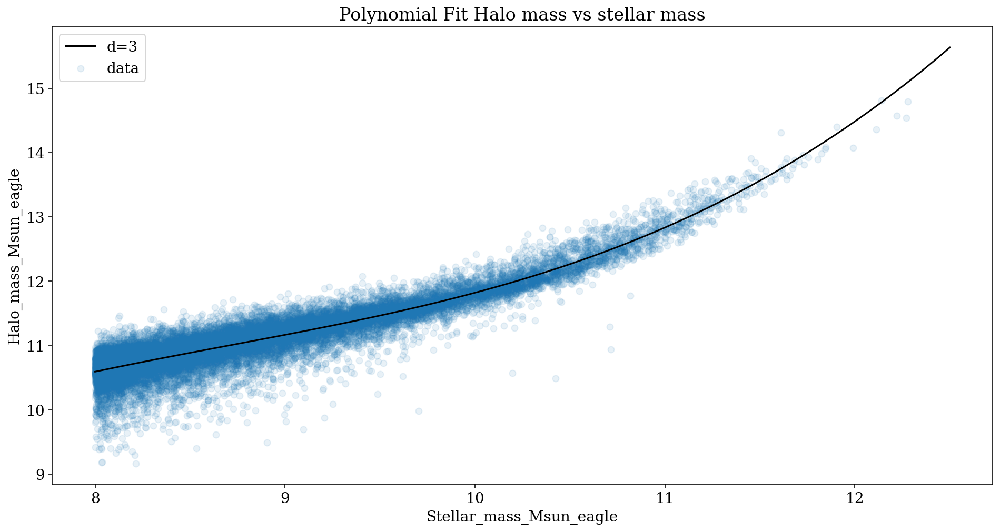

In [67]:
d_best = 3
best_model = PolynomialRegression(d_best)
best_model.fit(log_Mstar_eagle[:,np.newaxis], log_Mhalo_eagle)
M_pred = best_model.predict(log_M_grid[:,np.newaxis])
coeff = best_model.coef_
print(coeff)

plt.plot(log_M_grid, M_pred, label='d=%i'%d_best, c='k')
plt.scatter(log_Mstar_eagle, log_Mhalo_eagle, alpha=0.1, label='data')
plt.xlabel('Stellar_mass_Msun_eagle')
plt.ylabel('Halo_mass_Msun_eagle')
plt.title('Polynomial Fit Halo mass vs stellar mass')
plt.legend()
plt.show()

Now we have found an empirical relation between the halo mass and the stellar mass. We want to use this to find a relation between the SFR and the stellar mass. 



The 2D histogram of SFR vs Stellar mass from mpajhu catalogue is the following plot. In this case, we want to study the SFR as a fuction of the stellar mass, while previously we have done the opposite

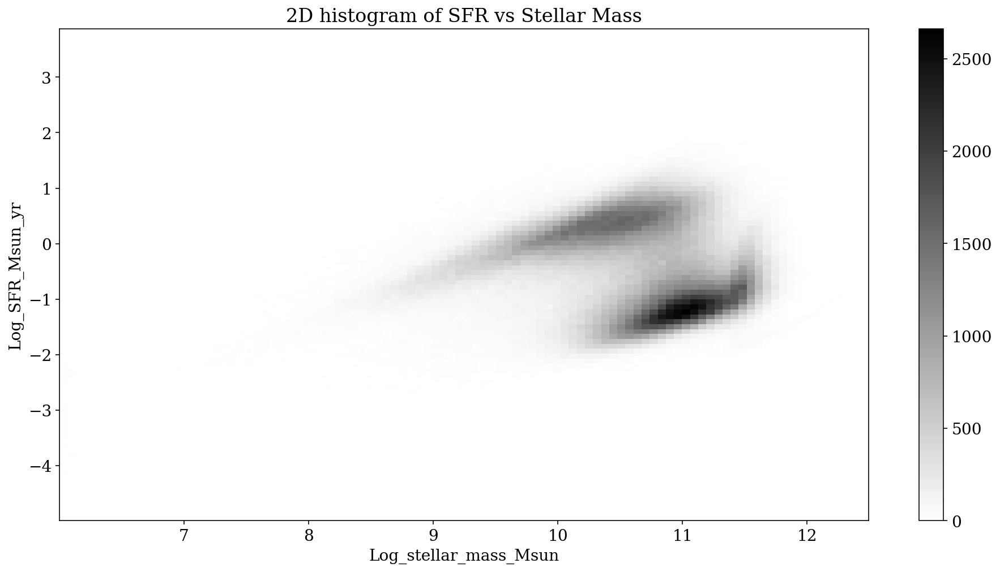

In [68]:
#reading data

key_x = 'Log_stellar_mass_Msun'
key_y = 'Log_SFR_Msun_yr'
key_z = 'Redshift'

mask = (data[mpajhu].field(key_x)>-9.99e3) & (data[mpajhu].field(key_y)>-9.99e3) & (data[mpajhu].field('Log_stellar_mass_Msun') > -9.99e3) & (data[mpajhu].field(key_z)>-9.99e3)  &(data[mpajhu].field('Parameter_flag')==1)

log_stellar_mass_mp = data[mpajhu].field(key_x)[mask]
log_SFR_mp = data[mpajhu].field(key_y)[mask]
z_mp = data[mpajhu].field(key_z)[mask]

plt.hist2d(log_stellar_mass_mp, log_SFR_mp, bins=100, cmap='binary')
plt.colorbar()
plt.xlabel(key_x)
plt.ylabel(key_y)
plt.title('2D histogram of SFR vs Stellar Mass')
plt.show()

We can see that the two distributions are not well orientated with the axis, so we can define the specific star formation rate, in order to have a better visualization

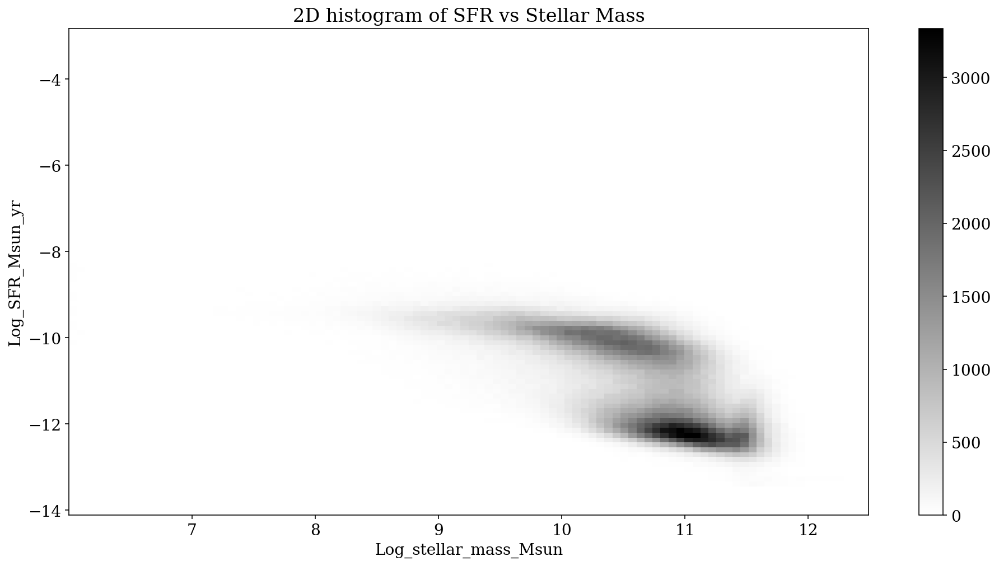

In [69]:
log_sp_SFR_mp = log_SFR_mp - log_stellar_mass_mp #in a log scale is a minus, normally a division

plt.hist2d(log_stellar_mass_mp, log_sp_SFR_mp, bins=100, cmap='binary')
plt.colorbar()
plt.xlabel(key_x)
plt.ylabel(key_y)
plt.title('2D histogram of SFR vs Stellar Mass')
plt.show()

In [70]:
# now perform a clustering on the specific SFR vs the stellar mass
n_clusters = 2
clf = KMeans(n_clusters=n_clusters)

X = np.array([log_stellar_mass_mp, log_sp_SFR_mp]).T
clf.fit(X)
centers = clf.cluster_centers_ 
labels = clf.predict(X)

In [71]:
edge1 = np.mean([max(log_sp_SFR_mp[labels==0]), min(log_sp_SFR_mp[labels==1])])
print(edge1)

-8.467330932617188


From the model prediction, the galaxies stop eating gas when the mass of the halo reach a value of $(10^{12}-10^{13})M_\odot$. This value of the halo mass correspond to a stellar mass of $\sim10^{11}$, from the empirical relation we have just found. We can compare this value for the stellar mass to this 2D histogram and check if it's consistent with the division of the 2 type of galaxies.

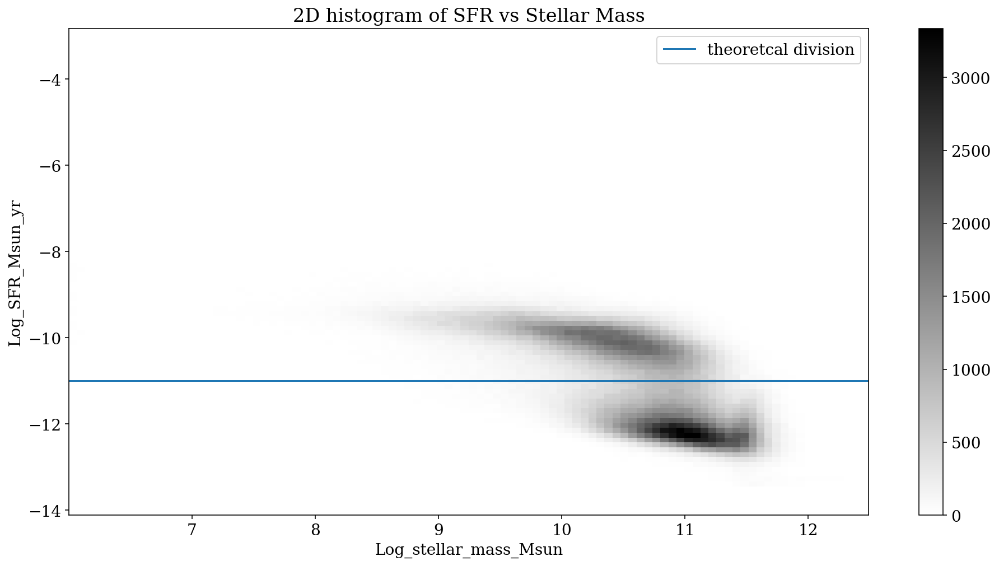

In [72]:
plt.hist2d(log_stellar_mass_mp, log_sp_SFR_mp, bins=100, cmap='binary')
plt.colorbar()
cut = -11
plt.axhline(cut, label='theoretcal division' )
plt.xlabel(key_x)
plt.ylabel(key_y)
plt.legend()
plt.title('2D histogram of SFR vs Stellar Mass')
plt.show()

It seems to be consistent

Our goal is to find a theoretical relation between the SFR and the stellar mass and check if this is consistent with this distribution.

We have a relation between the Stellar mass and the halo mass. We can write $\dot{M}_{in}$ as a function of the halo mass, and use the relation between the SFR and $\dot{M}_{in}$ to finally found the relation between the SFR and the stellar mass.

Stellar mass -> M halo -> M_in -> SFR

**new assumption:** $\frac{dM_{gas}}{dt} = 0$  
This means $\frac{dM_{gas}^{in}}{dt} - \frac{dM_{gas}^{out}}{dt} - SFR = 0$, and moreover $\frac{dM_{gas}^{out}}{dt} = \eta SFR$, because the quantity of expelled gas will again depend on how fast the galaxy forms stars. Thus  
$SFR (1 + \eta) = \frac{dM_{gas}^{in}}{dt} \implies SFR = \frac{1}{1 + \eta}\frac{dM_{gas}^{in}}{dt}$: **the important variable is $\dot{M}_{gas}^{in}$**

**which physical processes determine the gas inflow?**  
1) gravitational attraction ($\implies \tau_{ff}$ free fall time)  
2) pressure($\implies \tau_{cool}$ cooling time)  
The  gravitational potential depends on the total mass of the galaxy: gas, stars, **dark matter**.  
The collapse can happen only if $\tau_{cool} < \tau_{ff} \implies$ efficient range of masses: $(10^8, 10^{13}) M_\odot$  
*(more details on the notes)*  
**note** here $M = M_{dm} + M_* + M_{gas}$, it's the total (gravitational) mass.  
if $M > 10^{13} M_\odot \implies$ the inflow stops and the $SFR$ drops to zero. $\implies$ red galaxy clusters.

we need the relation between $\dot{M}_{gas}^{in}$ and $M$:  
McBride et al (2009): $<\dot{M}> = 42 M_\odot yr^{-1} \bigl(\frac{M}{10^{12} M_\odot} \bigr)^{1.127} (1 + 1.17z)\sqrt{\Omega_M (1+z)^3 + \Omega_\Lambda}$  
**$\dot{M} \sim$ linear in $M$** $\implies SFR = \mu M$ for a certain $\mu$.

In [73]:
#dividing the two different types of galaxies

log_SM_starforming_mp = log_stellar_mass_mp[log_sp_SFR_mp>=cut]
log_SM_passive_mp = log_stellar_mass_mp[log_sp_SFR_mp<cut]

log_sp_SFR_starforming_mp = log_sp_SFR_mp[log_sp_SFR_mp>=cut]
log_sp_SFR_passive_mp = log_sp_SFR_mp[log_sp_SFR_mp<cut]

log_SFR_starforming_mp = log_SFR_mp[log_sp_SFR_mp>=cut]
log_SFR_passive_mp = log_SFR_mp[log_sp_SFR_mp<cut]

z_starforming_mp = z_mp[log_sp_SFR_mp>=cut]
z_passive_mp = z_mp[log_sp_SFR_mp<cut]

Plot the two different cluster of galaxies:

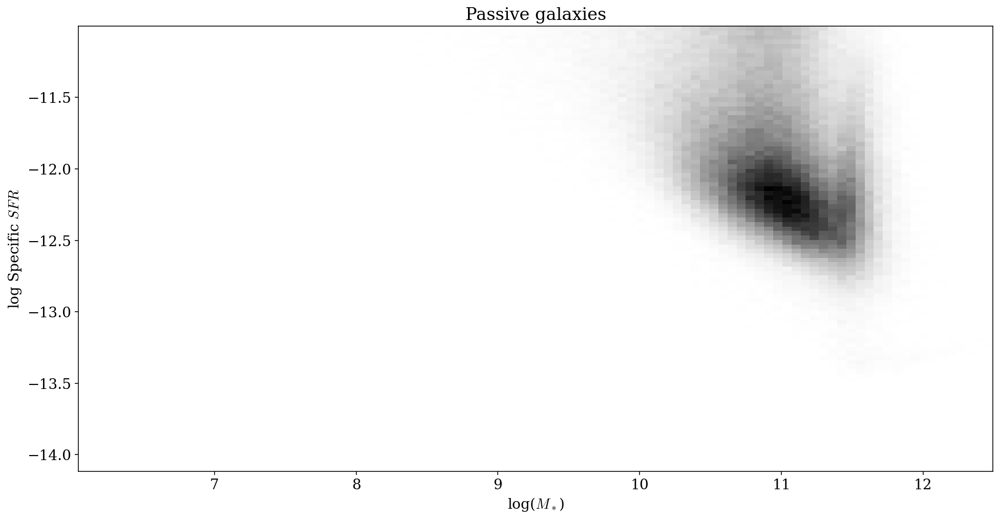

In [74]:
plt.hist2d(log_SM_passive_mp, log_sp_SFR_passive_mp, bins = 100, cmap = 'binary', density = True)
plt.xlabel('log($M_*$)')
plt.ylabel('log Specific $SFR$')
plt.title('Passive galaxies')
plt.show()

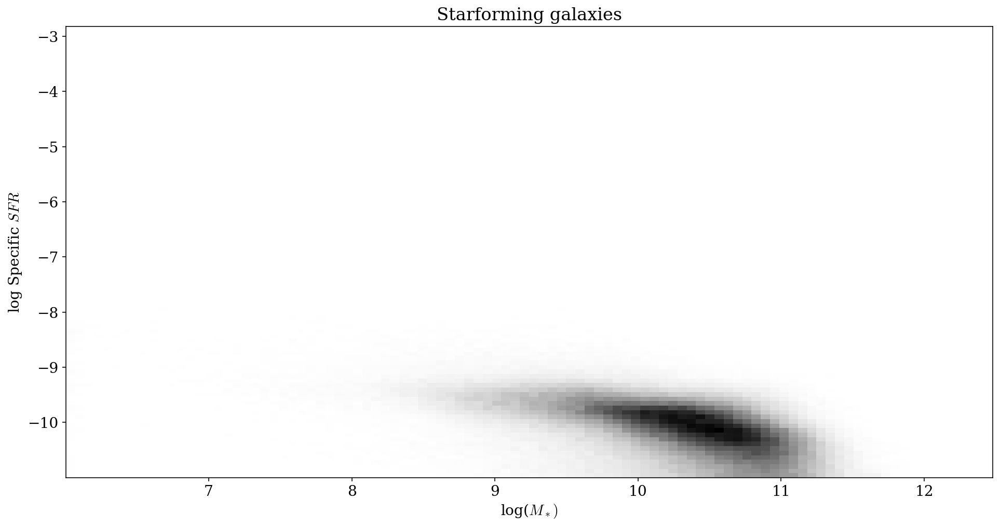

In [75]:
plt.hist2d(log_SM_starforming_mp, log_sp_SFR_starforming_mp, bins = 100, cmap = 'binary', density = True)
plt.xlabel('log($M_*)$')
plt.ylabel('log Specific $SFR$')
plt.title('Starforming galaxies')
plt.show()

In [76]:
# generate value for the halo mass from the model we have created before:

log_M_halo_mp = best_model.predict(log_stellar_mass_mp[:,np.newaxis])

log_M_halo_starforming_mp = log_M_halo_mp[log_sp_SFR_mp>=cut]
log_M_halo_passive_mp = log_M_halo_mp[log_sp_SFR_mp<cut]

In [77]:
z_mean_starforming_mp = np.mean(z_starforming_mp)
z_mean_passive_mp = np.mean(z_passive_mp)
z_mean_mp = np.mean(z_mp)
print(z_mean_mp)

0.11630087881747615


Now we define the function that gives the stellar mass from the halo mass:

McBride et al (2009): $<\dot{M}> = 42 M_\odot yr^{-1} \bigl(\frac{M}{10^{12} M_\odot} \bigr)^{1.127} (1 + 1.17z)\sqrt{\Omega_M (1+z)^3 + \Omega_\Lambda}$  
or:  
$<\dot{M}>_{median} = 24.1 M_\odot yr^{-1} \bigl(\frac{M}{10^{12} M_\odot} \bigr)^{1.094} (1 + 1.175z)\sqrt{\Omega_M (1+z)^3 + \Omega_\Lambda}$  
model: $<\dot{M}> = K M_\odot yr^{-1} \bigl(\frac{M}{10^{12} M_\odot} \bigr)^{\alpha} (1 + 1.17z)\sqrt{\Omega_M (1+z)^3 + \Omega_\Lambda}$  
from McBride, the mean is higher because of the log positive tail

We can write the McBride fuction as:

$<\dot{M}_{in}> = \gamma\bigl(M_{halo}\bigr)^{\alpha}$

where $\gamma$ is a normalization function.

Since we are looking for scale relation, we can inglobe this $\gamma$ in the $1+\eta$ factor. So we can write:

$SFR = {M_{halo}\over{1+\eta}}$

In [78]:
#useless

def M_in_McBride(log_halo_mass):
    planck = Planck18_arXiv_v2 #actual cosmological measures
    O_m = planck.Om0
    O_de = planck.Ode0
    M = 10**(log_halo_mass)/(1e12)
    K = 24
    alpha = 1.094
    z=z_mean_mp
    return K * M**(alpha) * (1+1.17*z) * np.sqrt(O_m*(1+z)**3 + O_de)

The SFR is given by: 

$SFR = {1\over{1+\eta}}\dot{M}_{in}$

where $\dot{M}_{in}$ is given by the McBride relation, that we can rewrite as: $<\dot{M}_{in}> = \gamma\bigl(M_{halo}\bigr)^{\alpha}$. Inglobing $\gamma$ in $1+\eta$ we get the function for the SFR as a function of the halo mass.


In [111]:
def SFR_func (log_halo_mass, eta):
    M_halo = 10**(log_halo_mass-12) #normalization
    alpha = 1.127
    return (M_halo**alpha)*eta

Now we fit the data for the SFR with the theoretical function above

In [112]:
# Starforming

p0_starforming = [30]
mask_starforming = (log_M_halo_starforming_mp>8) & (log_M_halo_starforming_mp<13)
p_starforming, cov_starforming = curve_fit(SFR_func, log_M_halo_starforming_mp[mask_starforming], 10**(log_SFR_starforming_mp[mask_starforming]), p0=p0_starforming)

print(p_starforming)

[0.87379222]


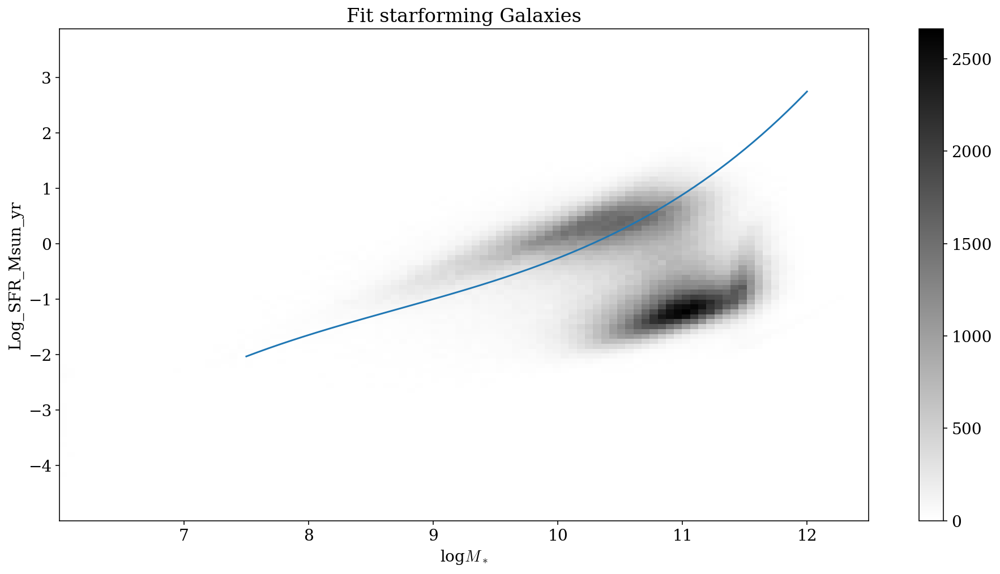

In [113]:
plt.hist2d(log_stellar_mass_mp, log_SFR_mp, bins=100, cmap='binary')
plt.colorbar()
plt.xlabel('log$M_*$')
plt.ylabel(key_y)

SM_grid = np.linspace(7.5, 12, 200)
MH_grid = best_model.predict(SM_grid[:,np.newaxis])
plt.plot(SM_grid, np.log10(SFR_func(MH_grid, *p_starforming)))

plt.title('Fit starforming Galaxies')
plt.show()

In [114]:
# passive galaxies

p0_passive = [30]
mask_passive = (log_M_halo_passive_mp>10) & (log_M_halo_passive_mp<14.5)
p_passive, cov_passive = curve_fit(SFR_func, log_M_halo_passive_mp[mask_passive], 10**(log_SFR_passive_mp[mask_passive]), p0=p0_passive)

print(p_passive)

[0.00462055]


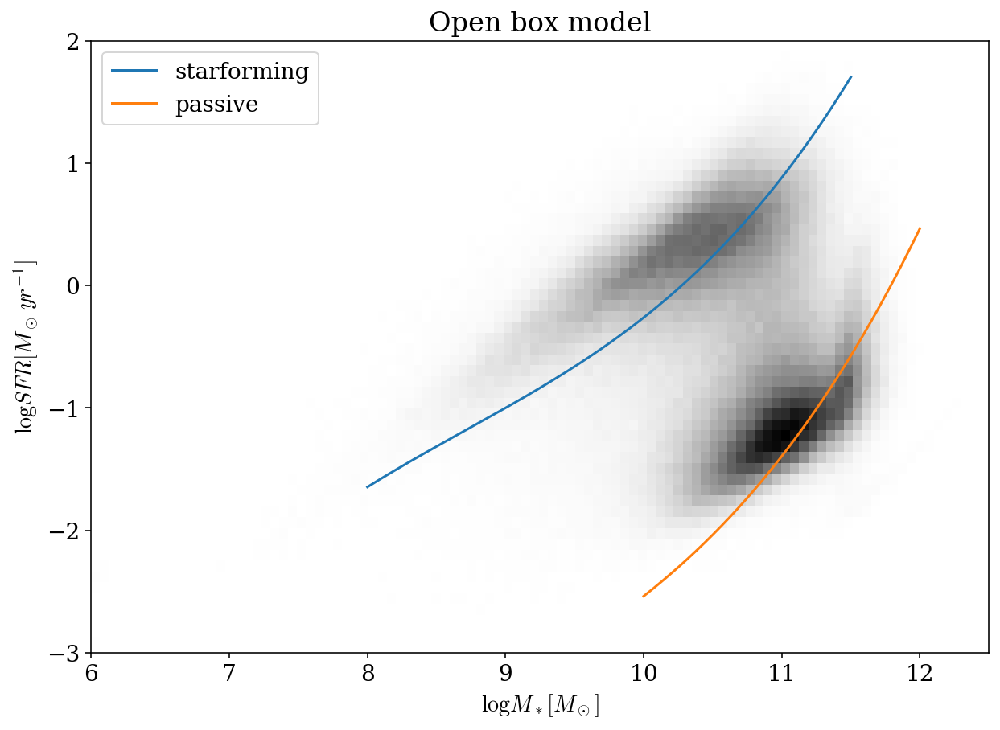

In [115]:
figure = plt.figure(figsize=(10,7))
ax = plt.subplot(111)
ax.hist2d(log_stellar_mass_mp, log_SFR_mp, bins=100, cmap='binary')
#plt.colorbar()

SM_grid = np.linspace(8, 11.5, 200)
MH_grid = best_model.predict(SM_grid[:,np.newaxis])
ax.plot(SM_grid, np.log10(SFR_func(MH_grid, *p_starforming)), label='starforming')

SM_grid = np.linspace(10, 12, 200)
MH_grid = best_model.predict(SM_grid[:,np.newaxis])
ax.plot(SM_grid, np.log10(SFR_func(MH_grid, *p_passive)), label='passive')

ax.set_xlim(6,12.5)
ax.set_ylim(-3,2)

ax.set_xlabel(r'$\log{M_*[M_\odot]}$')
ax.set_ylabel(r'$\log{SFR[M_\odot\,yr^{-1}]}$')

plt.legend(loc='upper left')

plt.savefig('open_box.pdf', format='pdf')
plt.title('Open box model')
plt.savefig('open_box_title.jpg', format='jpg', dpi=300)
plt.show()

From these plot we can see that for high value of stellar mass the SFR keep increasing. But we expect that over a certain value of the halo mass (and so of the stellar mass) the gas cannot accreate anymore in the galaxy, because of its cooling time, and 
the galaxy we are considering became a closed system, a closed box. From this point on, the galaxy will evolve as we saw before and the SFR will fall exponentially to zero. This happens because $\dot{M}_{in}->0$ and the only way to have equilibrium is if the SFR goes to zero too. But in these plot above this behaviour is not observed. We need an additional $\dot{M}_{out}$ term, that allowed the SFR to decrease and at the same time to have a $\dot{M}_{in}$ term different from zero.

## AGN contribution

Now we want to consider the contribution of the AGN for the outflow of gas from the galaxy. The equation for the equilibrium of the variation of gas is given by the following:

$\dot{M}_{in} = SFR + \eta SFR + \dot{M}_{out, AGN}$

where $\dot{M}_{out, AGN}$ does not depend on the SFR. We can solve this equation for the SFR and we get:
$SFR \propto {\dot{M}_{in} - \dot{M}_{out, AGN}\over{1+\eta}}$

$\dot{M}_{out, AGN}$ is given by the relation between the massive black hole at the center of the galaxy taken in account and the dispersion velocity of the stellar bulge. We assume that the rate of mass that exit from the galaxy is proportional to the rate of mass that fall in the black hole at its centre: $\dot{M}_{out, AGN} \propto \dot{M}_{in, BH}$.

We know that ${M}_{in, BH} \propto \sigma^4$, where $\sigma$ is the dispersion velocity of the stellar bulge. Assuming circular velocities, and since the system we are considering is a virialized one, we have that:

$\sigma\propto v^2$ where v is the circular velocity: $v = {GM\over r}$. So:

${M}_{in,BH} \propto {G^2M^2\over {r^2}}$

Now, assuming a spherical distribution for the dark matter halo, we can write $r\propto M^{1/3}$. This led us to a relation between the mass of the BH and the mass of the dark matter halo:

$M_{in, BH} \propto M_{halo}^{4\over3}$

Assuming a dislike accretion, $\dot{M}_{in, BH} \propto M_{in, BH}$, and so:

$\dot{M}_{out, AGN} \propto  M_{halo}^{4\over3}$

From the catalogue: $\textit{agn_cat}$ we can find the galaxies with AGN and without AGN through the study of the emission lines from galaxies.

In [84]:
# reading data:

H_alpha, err_H_alpha = data[agn_cat].field('Halpha_flux'), data[agn_cat].field('Halpha_flux_error')
H_beta, err_H_beta = data[agn_cat].field('Hbeta_flux'), data[agn_cat].field('Hbeta_flux_error')
O_III, err_O_III = data[agn_cat].field('OIII_flux'), data[agn_cat].field('OIII_flux_error')
N_II, err_N_II = data[agn_cat].field('NII_flux'), data[agn_cat].field('NII_flux_error')

SNR_thr = 1 # threshold for the signal-to-noise ratio

mask1 = ((H_alpha>0) & (H_beta>0) & (O_III>0) & (N_II>0) & 
         (H_alpha>err_H_alpha*SNR_thr) & (H_beta>err_H_beta*SNR_thr) & 
         (O_III>err_O_III*SNR_thr) & (N_II>err_N_II*SNR_thr) )

mask2 = (data[agn_cat].field('Log_stellar_mass_Msun')>-9.99e3) & (data[agn_cat].field('Log_SFR_Msun_yr')>-9.99e3) & (data[agn_cat].field('Redshift')>-9.99e3) & (data[agn_cat].field('Parameter_flag')==1) 

mask = mask1 & mask2

Log_stellar_mass_AGN_cat = data[agn_cat].field('Log_stellar_mass_Msun')[mask]
Log_SFR_AGN_cat = data[agn_cat].field('Log_SFR_Msun_yr')[mask]
z_AGN_cat =  data[agn_cat].field('Redshift')[mask]
Log_halo_mass_AGN_cat = best_model.predict(Log_stellar_mass_AGN_cat[:,np.newaxis])
SDSS_ID = data[agn_cat].field('SDSS_SpecObjID_1')[mask]

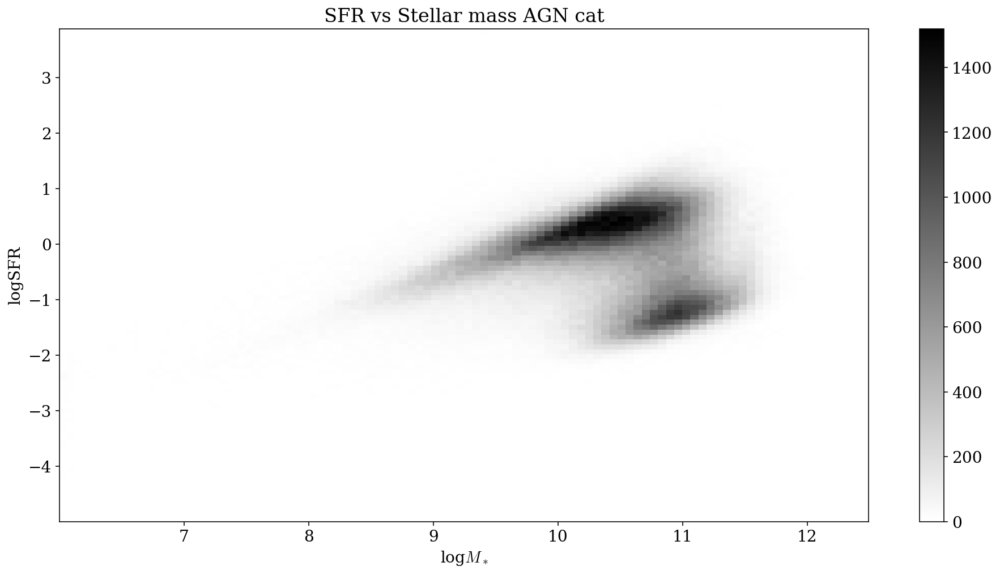

In [85]:
plt.hist2d(Log_stellar_mass_AGN_cat, Log_SFR_AGN_cat, bins=100, cmap='binary')
plt.colorbar()
plt.xlabel('log$M_*$')
plt.ylabel('logSFR')
plt.title('SFR vs Stellar mass AGN cat')
plt.show()

we can define also in this case the specific SFR and plot the edge between the two classes of galaxies.

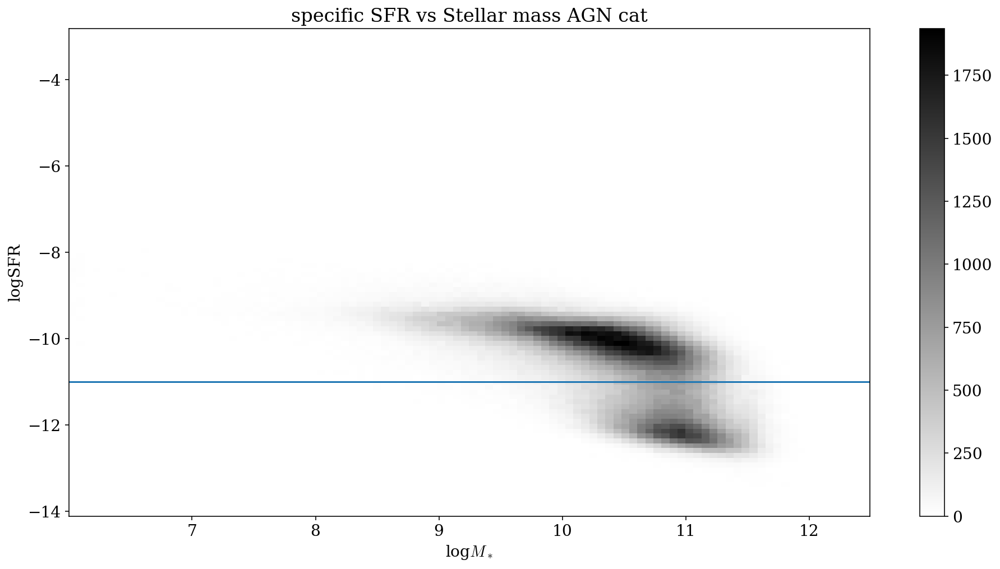

In [86]:
Log_sp_SFR_AGN_cat = Log_SFR_AGN_cat - Log_stellar_mass_AGN_cat

plt.hist2d(Log_stellar_mass_AGN_cat, Log_sp_SFR_AGN_cat, bins=100, cmap='binary')
plt.colorbar()
plt.xlabel('log$M_*$')
plt.ylabel('logSFR')
plt.title('specific SFR vs Stellar mass AGN cat')

cut = -11

plt.axhline(cut)

plt.show()

In [87]:
#now we divide the starforming galaxies from the passive one

log_SM_starforming_AGN = Log_stellar_mass_AGN_cat[Log_sp_SFR_AGN_cat>=cut]
log_SM_passive_AGN = Log_stellar_mass_AGN_cat[Log_sp_SFR_AGN_cat<cut]

log_sp_SFR_starforming_AGN = Log_sp_SFR_AGN_cat[Log_sp_SFR_AGN_cat>=cut]
log_sp_SFR_passive_AGN = Log_sp_SFR_AGN_cat[Log_sp_SFR_AGN_cat<cut]

log_SFR_starforming_AGN = Log_SFR_AGN_cat[Log_sp_SFR_AGN_cat>=cut]
log_SFR_passive_AGN = Log_SFR_AGN_cat[Log_sp_SFR_AGN_cat<cut]

z_starforming_AGN = z_AGN_cat[Log_sp_SFR_AGN_cat>=cut]
z_passive_AGN = z_AGN_cat[Log_sp_SFR_AGN_cat<cut]

Log_halo_mass_starforming_AGN = best_model.predict(log_SM_starforming_AGN[:,np.newaxis])
Log_halo_mass_passive_AGN = best_model.predict(log_SM_passive_AGN[:,np.newaxis])

starforming_ID = SDSS_ID[Log_sp_SFR_AGN_cat>=cut]
passive_ID = SDSS_ID[Log_sp_SFR_AGN_cat<cut]

In [88]:
z_mean_starforming_AGN = np.mean(z_starforming_AGN)
z_mean_passive_AGN = np.mean(z_passive_AGN)
z_mean_AGN = np.mean(z_AGN_cat)

We want to find a way to discriminate which galaxies have an AGN and which does not. In order to do this we used a relation on the emission lines of different atoms in the galaxies. The relation used is from the kaufmann et al's paper of 2003: $\textbf{a galaxy is defined to be an AGN if}$:

$\log\bigr({{OIII}\over{H\beta}}\bigr) >  { {0.61} \over {\log\bigl({{NII}\over{H\alpha}}\bigr) - 0.05}} + 1.3 $

In [89]:
H_alpha, err_H_alpha = H_alpha[mask], err_H_alpha[mask]
H_beta, err_H_beta = H_beta[mask], err_H_beta[mask]
O_III, err_O_III = O_III[mask], err_O_III[mask]
N_II, err_N_II = N_II[mask], err_N_II[mask]

bpt_y = O_III / H_beta
bpt_x = N_II / H_alpha

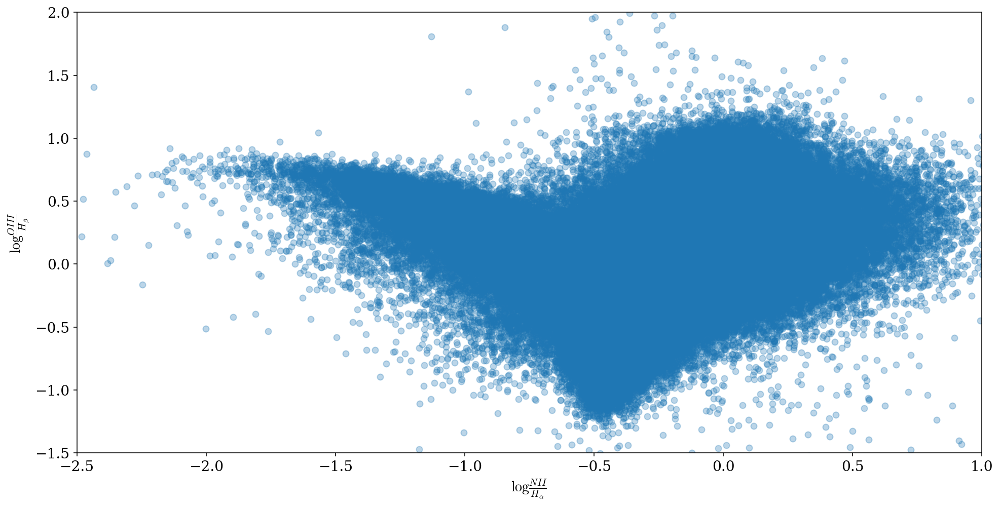

In [90]:
plt.scatter(np.log10(bpt_x), np.log10(bpt_y), alpha=0.3)
plt.xlim(-2.5,1)
plt.ylim(-1.5,2)
plt.ylabel(r'$\log \frac{OIII}{H_\beta}$')
plt.xlabel(r'$\log \frac{NII}{H_\alpha}$')
plt.show()

In [91]:
# define the function to discriminate AGN galaxies from non-AGN galaxies
# at 0.05 the function doverges, so we have to put constraint

def kauffmann(x):
    return np.where(x<0.05, 0.61/(x-0.05) + 1.3, -10)

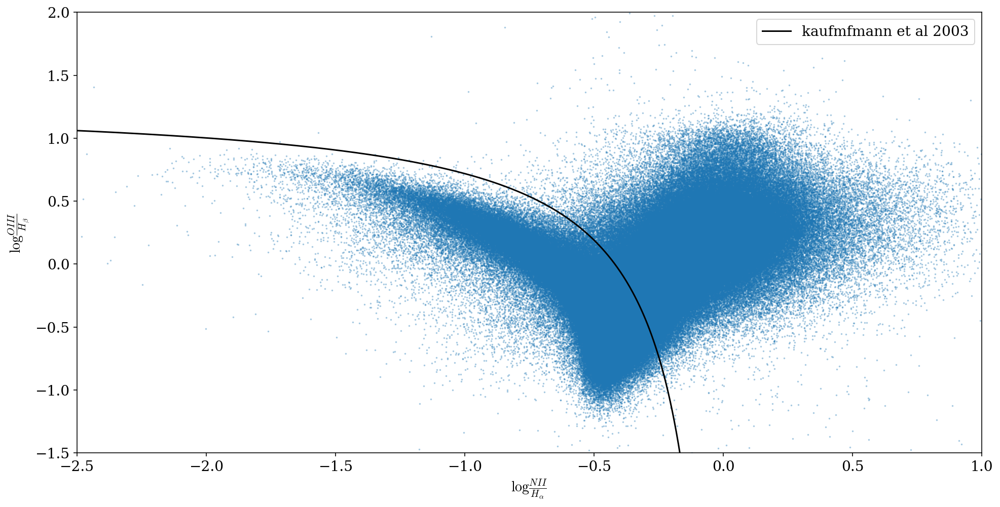

In [92]:
logx = np.log10(bpt_x)
logy = np.log10(bpt_y)
x_grid = np.linspace(-3, 1, 1000)

plt.scatter(logx,logy, s=0.7, alpha=0.3)
plt.plot(x_grid, kauffmann(x_grid), '-k', label = 'kaufmfmann et al 2003')
plt.xlim(-2.5,1)
plt.ylim(-1.5,2)
plt.ylabel(r'$\log \frac{OIII}{H_\beta}$')
plt.xlabel(r'$\log \frac{NII}{H_\alpha}$')
plt.legend()
plt.show()

Now, the galaxies that lie over the black line are the AGN galaxies, the ones that lie under the black line are the non-AGN. We discriminate them:

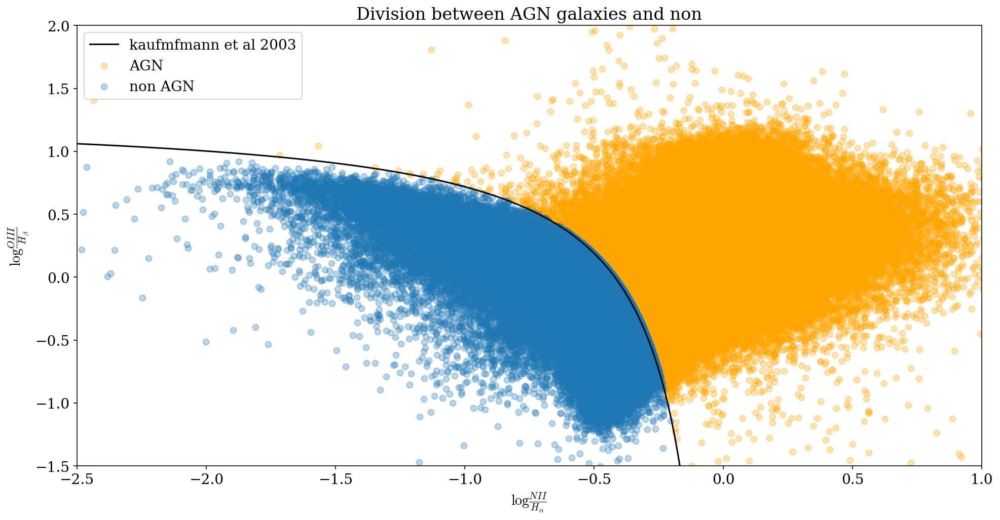

In [93]:
kauffmann_values = kauffmann(logx)

AGN_mask = logy > kauffmann_values
non_AGN_mask = logy <= kauffmann_values

logx_AGN = logx[AGN_mask]
logy_AGN = logy[AGN_mask]

logx_non_AGN = logx[non_AGN_mask]
logy_non_AGN = logy[non_AGN_mask]

plt.scatter(logx_AGN, logy_AGN, c='orange', alpha=0.3, label='AGN')
plt.scatter(logx_non_AGN, logy_non_AGN, alpha=0.3, label='non AGN')
plt.plot(x_grid, kauffmann(x_grid), '-k', label = 'kaufmfmann et al 2003')
plt.xlim(-2.5,1)
plt.ylim(-1.5,2)
plt.legend()
plt.ylabel(r'$\log \frac{OIII}{H_\beta}$')
plt.xlabel(r'$\log \frac{NII}{H_\alpha}$')
plt.title('Division between AGN galaxies and non')
plt.show()

In [94]:
# now divide also the other properties of the galaxies between AGN and non

# AGN galaxies
log_SM_w_AGN = Log_stellar_mass_AGN_cat[AGN_mask]
log_sp_SFR_w_AGN = Log_sp_SFR_AGN_cat[AGN_mask]
log_SFR_w_AGN = Log_SFR_AGN_cat[AGN_mask]
z_w_AGN = z_AGN_cat[AGN_mask]
log_halo_mass_w_AGN = Log_halo_mass_AGN_cat[AGN_mask]
SSID_w_AGN = SDSS_ID[AGN_mask]

# no AGN galaxies
log_SM_no_AGN = Log_stellar_mass_AGN_cat[non_AGN_mask]
log_sp_SFR_no_AGN = Log_sp_SFR_AGN_cat[non_AGN_mask]
log_SFR_no_AGN = Log_SFR_AGN_cat[non_AGN_mask]
z_no_AGN = z_AGN_cat[non_AGN_mask]
log_halo_mass_no_AGN = Log_halo_mass_AGN_cat[non_AGN_mask]
SSID_no_AGN = SDSS_ID[non_AGN_mask]

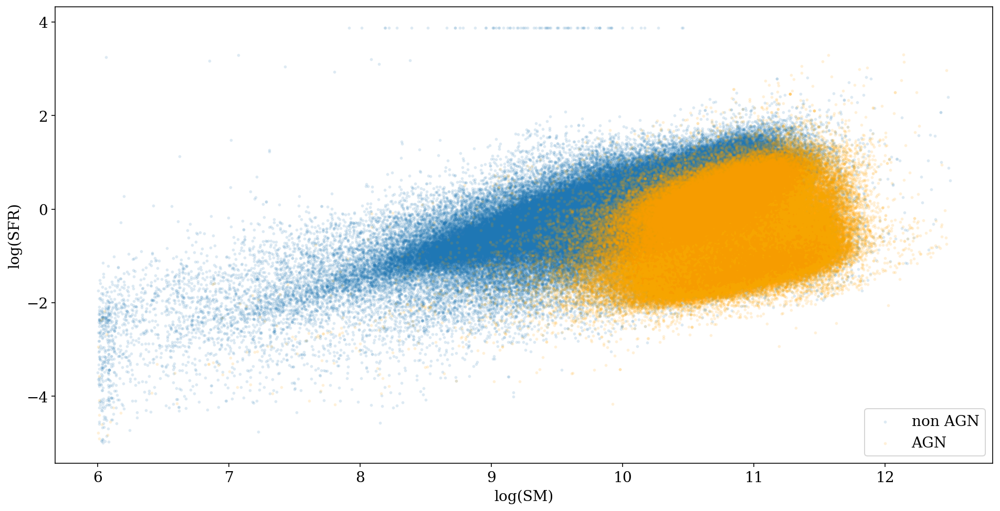

In [95]:
plt.scatter(log_SM_no_AGN, log_SFR_no_AGN, label='non AGN', alpha=0.1, s=4)
plt.scatter(log_SM_w_AGN, log_SFR_w_AGN, label='AGN', c='orange', alpha=0.1, s=4)
plt.xlabel('log(SM)')
plt.ylabel('log(SFR)')
plt.legend()
plt.show()

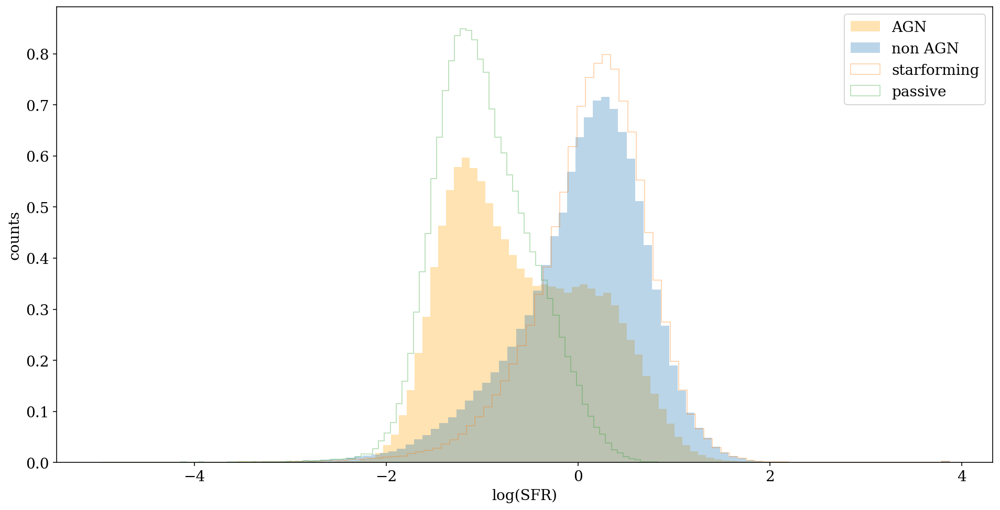

In [96]:
plt.hist(log_SFR_w_AGN, bins=100, alpha=0.3, density=True, label='AGN', color='orange')
plt.hist(log_SFR_no_AGN, bins=100, alpha=0.3, density=True, label='non AGN')
plt.hist(log_SFR_starforming_AGN, bins=100, alpha=0.3, histtype='step', density=True, label='starforming')
plt.hist(log_SFR_passive_AGN, bins=100, alpha=0.3, histtype='step', density=True, label='passive')
plt.legend()
plt.xlabel('log(SFR)')
plt.ylabel('counts')
plt.show()

Now we plot the passive and the starfroming galaxies taking in account which of these are AGN and which are not.

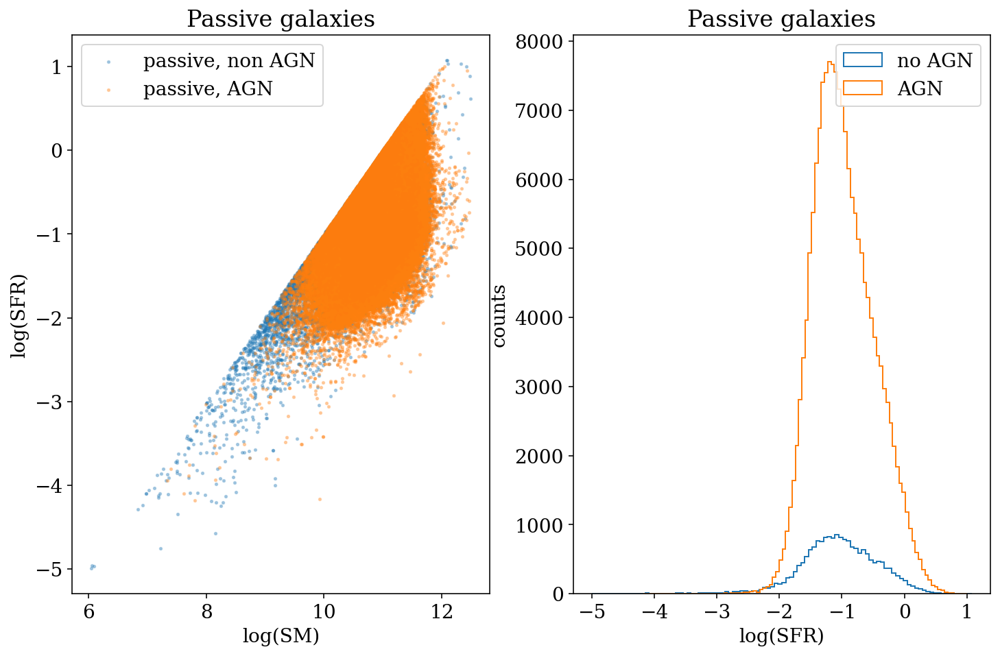

In [97]:
# passive galaxies:

fig, axs = plt.subplots(1, 2, figsize=(12,7.5))

passive_no_AGN = np.isin(passive_ID, SSID_no_AGN)
passive_w_AGN = np.isin(passive_ID, SSID_w_AGN)


axs[0].scatter(log_SM_passive_AGN[passive_no_AGN], log_SFR_passive_AGN[passive_no_AGN], s=3, alpha=0.3, label='passive, non AGN')
axs[0].scatter(log_SM_passive_AGN[passive_w_AGN], log_SFR_passive_AGN[passive_w_AGN], s=3, alpha=0.3, label='passive, AGN')
axs[0].legend()
axs[0].set_xlabel('log(SM)')
axs[0].set_ylabel('log(SFR)')
axs[0].set_title('Passive galaxies')

axs[1].hist(log_SFR_passive_AGN[passive_no_AGN], bins=100, histtype='step', label='no AGN')
axs[1].hist(log_SFR_passive_AGN[passive_w_AGN], bins=100, histtype='step', label='AGN')
axs[1].set_xlabel('log(SFR)')
axs[1].set_ylabel('counts')
axs[1].set_title('Passive galaxies')
axs[1].legend()
plt.show()

We can see that the majority of the passive galaxies are with AGN. Now we quantify this value:

In [98]:
print('Number of passive galaxies: ', len(log_SFR_passive_AGN))
print('->of which %.i AGNs, %.i non AGNs, meaning:' %(len(log_SFR_passive_AGN[passive_w_AGN]), len(log_SFR_passive_AGN[passive_no_AGN]) ))
print('-> %.2f AGNs, %.2f non AGNS' % (len(log_SFR_passive_AGN[passive_w_AGN])/len(log_SFR_passive_AGN), len(log_SFR_passive_AGN[passive_no_AGN])/len(log_SFR_passive_AGN)))
      

Number of passive galaxies:  191220
->of which 172015 AGNs, 19205 non AGNs, meaning:
-> 0.90 AGNs, 0.10 non AGNS


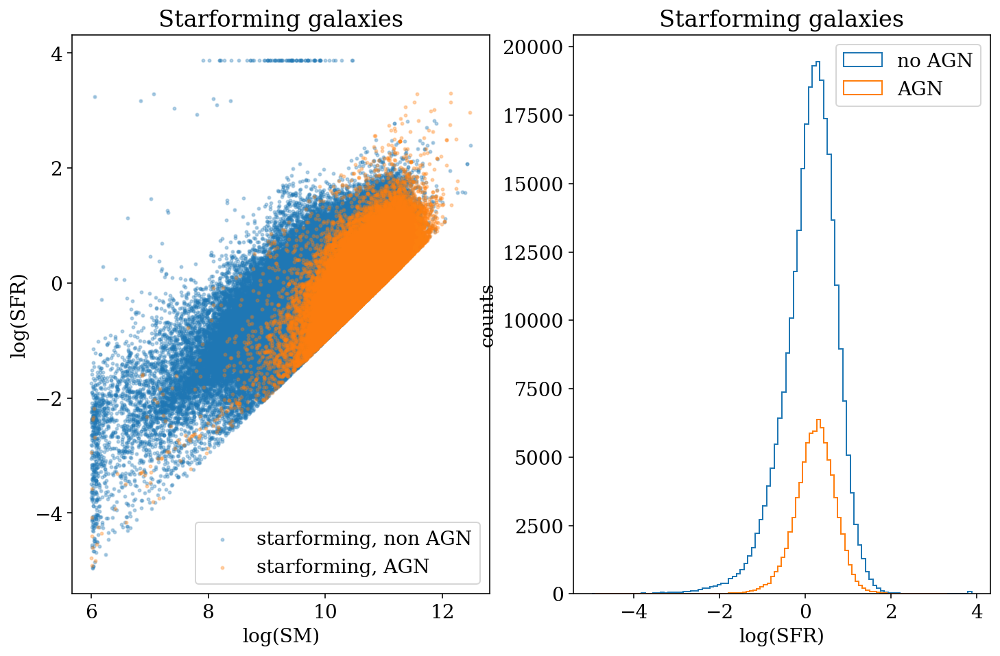

In [99]:
# starforming galaxies:

fig, axs = plt.subplots(1, 2, figsize=(12,7.5))

starforming_no_AGN = np.isin(starforming_ID, SSID_no_AGN)
starforming_w_AGN = np.isin(starforming_ID, SSID_w_AGN)


axs[0].scatter(log_SM_starforming_AGN[starforming_no_AGN], log_SFR_starforming_AGN[starforming_no_AGN], s=4, alpha=0.3, label='starforming, non AGN')
axs[0].scatter(log_SM_starforming_AGN[starforming_w_AGN], log_SFR_starforming_AGN[starforming_w_AGN], s=4, alpha=0.3, label='starforming, AGN')
axs[0].legend()
axs[0].set_xlabel('log(SM)')
axs[0].set_ylabel('log(SFR)')
axs[0].set_title('Starforming galaxies')

axs[1].hist(log_SFR_starforming_AGN[starforming_no_AGN], bins=100, histtype='step', label='no AGN')

axs[1].hist(log_SFR_starforming_AGN[starforming_w_AGN], bins=100, histtype='step', label='AGN')
axs[1].set_xlabel('log(SFR)')
axs[1].set_ylabel('counts')
axs[1].set_title('Starforming galaxies')
axs[1].legend()
plt.show()

Here we can see that the majority of the starforming galaxies are without AGN, in particular:

In [100]:
print('Number of starforming galaxies: ', len(log_SFR_starforming_AGN))
print('->of which %.i AGNs, %.i non AGNs, meaning:' %(len(log_SFR_starforming_AGN[starforming_w_AGN]), len(log_SFR_starforming_AGN[starforming_no_AGN]) ))
print('-> %.2f AGNs, %.2f non AGNS' % (len(log_SFR_starforming_AGN[starforming_w_AGN])/len(log_SFR_starforming_AGN), len(log_SFR_starforming_AGN[starforming_no_AGN])/len(log_SFR_starforming_AGN)))

Number of starforming galaxies:  372304
->of which 82539 AGNs, 289765 non AGNs, meaning:
-> 0.22 AGNs, 0.78 non AGNS


Now we want to fit SFR vs SM using different function depending on if the galaxies have AGN or not. The function used to fit galaxies without AGN is the one used also before: 

$SFR = {\bigl(M_{halo}\bigr)^\alpha\over{1+\eta}}$

using $\eta$ as a free parameter.

But when we have to consider also AGN contribute we need to take in account an additional term that scale with the mass of the halo to the $4\over3$. Associated to this additional term we have an additional free parameter to determine from the fit. 

$SFR = {\dot{M}_{in} - \beta\dot{M}_{out, AGN}\over{1+\eta}}$

where $\dot{M}_{in} = \bigl(M_{halo}\bigr)^{\alpha}$   and $\dot{M}_{out, AGN}=kM_{halo}^{4\over3}$. $k$ is a constant of proportionality that can be inglobed in the $\beta$ factor. The final formula to determine the SFR for a galaxy with an AGN is given by:

$SFR = {\bigl(M_{halo}\bigr)^{\alpha} - \beta M_{halo}^{4\over3}\over{1+\eta}}$

In [101]:
def SFR_AGN_func(logM, eta, beta):
    M_halo = 10**(logM-12)
    alpha = 1.127
    return ((M_halo**alpha) - beta*M_halo**(4/3))/(1+eta)

Now we have to fit the AGN galaxies and non AGN galaxies differenciating also between starforming and passive galaxies.

### Starforming-AGN

In [102]:
log_SFR_starforming_w_AGN = log_SFR_starforming_AGN[starforming_w_AGN]
log_SM_starforming_w_AGN = log_SM_starforming_AGN[starforming_w_AGN]
log_Mhalo_starforming_w_AGN = Log_halo_mass_starforming_AGN[starforming_w_AGN]

p0 = [1,1]
p_SF_AGN, cov_SF_AGN = curve_fit(SFR_AGN_func, log_Mhalo_starforming_w_AGN[(log_Mhalo_starforming_w_AGN>8)&(log_Mhalo_starforming_w_AGN<13)], 10**log_SFR_starforming_w_AGN[(log_Mhalo_starforming_w_AGN>8)&(log_Mhalo_starforming_w_AGN<13)], p0=p0)

In [103]:
p_SF_AGN

array([-0.39820942,  0.48232166])

### Starforming-non AGN

In [104]:
log_SFR_starforming_no_AGN = log_SFR_starforming_AGN[starforming_no_AGN]
log_SM_starforming_no_AGN = log_SM_starforming_AGN[starforming_no_AGN]
log_Mhalo_starforming_no_AGN = Log_halo_mass_starforming_AGN[starforming_no_AGN]

p0 = [1]
p_SF_no_AGN, cov_SF_no_AGN = curve_fit(SFR_func, log_Mhalo_starforming_no_AGN[(log_Mhalo_starforming_no_AGN>8)&(log_Mhalo_starforming_no_AGN<13)], 10**log_SFR_starforming_no_AGN[(log_Mhalo_starforming_no_AGN>8)&(log_Mhalo_starforming_no_AGN<13)], p0=p0)

In [105]:
p_SF_no_AGN

array([-0.2350241])

### Passive-AGN

In [106]:
log_SFR_passive_w_AGN = log_SFR_passive_AGN[passive_w_AGN]
log_SM_passive_w_AGN = log_SM_passive_AGN[passive_w_AGN]
log_Mhalo_passive_w_AGN = Log_halo_mass_passive_AGN[passive_w_AGN]

p0 = [1,1]
p_passive_AGN, cov_passive_AGN = curve_fit(SFR_AGN_func, log_Mhalo_passive_w_AGN[(log_Mhalo_passive_w_AGN>10) & (log_Mhalo_passive_w_AGN<14.5)], 10**log_SFR_passive_w_AGN[(log_Mhalo_passive_w_AGN>10) & (log_Mhalo_passive_w_AGN<14.5)], p0=p0)

In [107]:
p_passive_AGN

array([31.80645081,  0.31878141])

### Passive-non AGN

In [108]:
log_SFR_passive_no_AGN = log_SFR_passive_AGN[passive_no_AGN]
log_SM_passive_no_AGN = log_SM_passive_AGN[passive_no_AGN]
log_Mhalo_passive_no_AGN = Log_halo_mass_passive_AGN[passive_no_AGN]

p0 = [1]
p_passive_no_AGN, cov_passive_no_AGN = curve_fit(SFR_func, log_Mhalo_passive_no_AGN[(log_Mhalo_passive_no_AGN>10) & (log_Mhalo_passive_no_AGN<14.5)], 10**log_SFR_passive_no_AGN[(log_Mhalo_passive_no_AGN>10) & (log_Mhalo_passive_no_AGN<14.5)], p0=p0)

In [109]:
p_passive_no_AGN

array([153.79821951])

## Plot of starforming and passive galaxies taking in account AGN contribute

C:\Users\Ludovico\anaconda3\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


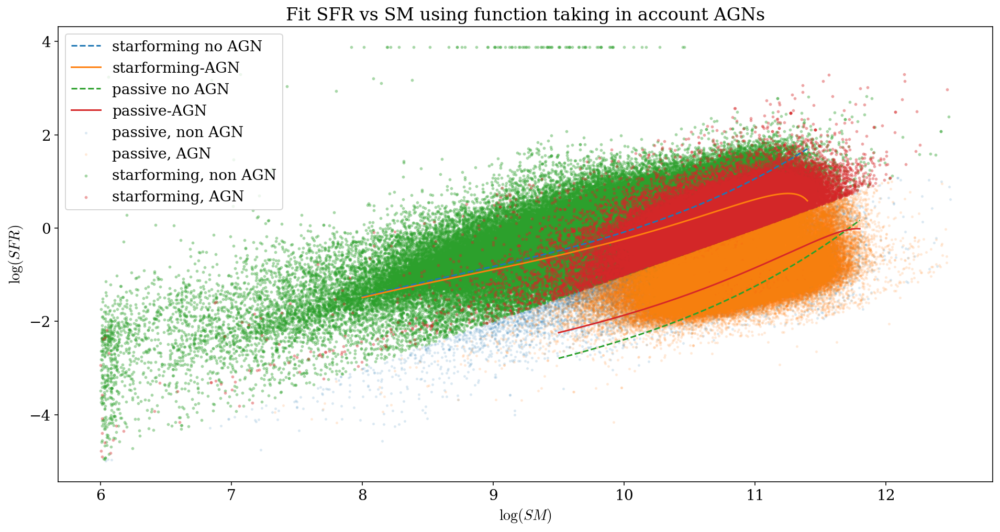

In [110]:
MS_grid_SF = np.linspace(8,11.4,200)
M_halo_grid_SF = best_model.predict(MS_grid_SF[:,np.newaxis])
MS_grid_passive = np.linspace(9.5,11.8,200)
M_halo_grid_passive = best_model.predict(MS_grid_passive[:,np.newaxis])

plt.plot(MS_grid_SF, np.log10(SFR_func(M_halo_grid_SF, *p_SF_no_AGN)), "--", label='starforming no AGN')
plt.plot(MS_grid_SF, np.log10(SFR_AGN_func(M_halo_grid_SF, *p_SF_AGN)), label='starforming-AGN')

plt.plot(MS_grid_passive, np.log10(SFR_func(M_halo_grid_passive, *p_passive_no_AGN)), "--", label='passive no AGN')
plt.plot(MS_grid_passive, np.log10(SFR_AGN_func(M_halo_grid_passive, *p_passive_AGN)), label='passive-AGN')

plt.scatter(log_SM_passive_AGN[passive_no_AGN], log_SFR_passive_AGN[passive_no_AGN], s=3, alpha=0.1, label='passive, non AGN')
plt.scatter(log_SM_passive_AGN[passive_w_AGN], log_SFR_passive_AGN[passive_w_AGN], s=3, alpha=0.1, label='passive, AGN')

plt.scatter(log_SM_starforming_AGN[starforming_no_AGN], log_SFR_starforming_AGN[starforming_no_AGN], s=4, alpha=0.3, label='starforming, non AGN')
plt.scatter(log_SM_starforming_AGN[starforming_w_AGN], log_SFR_starforming_AGN[starforming_w_AGN], s=4, alpha=0.3, label='starforming, AGN')


#plt.hist2d(Log_stellar_mass_AGN_cat, Log_SFR_AGN_cat, bins=100, cmap='binary')
plt.legend()
plt.title('Fit SFR vs SM using function taking in account AGNs')
plt.xlabel('$\log{(SM)}$')
plt.ylabel('$\log{(SFR)}$')
plt.show()

Now we can try to fit data using means and MAD with standard deviation.

## Means and MAD